In [3]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "" 
os.environ["JAX_PLATFORMS"] = "cpu"
import jax
jax.config.update('jax_platform_name', 'cpu')

import pickle 
import re
# import os

import numpy as np

import matplotlib.pyplot as plt
import loco_mujoco.evaluation.evaluation_prosthesis as eval_pros

import importlib
importlib.reload(eval_pros)

postprocess_handler = eval_pros.PostProcessMetricsHandler()

# from loco_mujoco.evaluation.evaluation_prosthesis import PostProcessMetricsHandler
# import importlib

# postprocess_handler = PostProcessMetricsHandler()

# importlib.reload(importlib.import_module("evaluation_prosthesis"))

# postprocess_handler = PostProcessMetricsHandler()

min_walk_step_length = 60 #60 # based on testing with initial data
min_contact_length = 20

In [4]:
# # Get joint names from the first trajectory's info
# joint_names = all_trajs[0].info.joint_names
# print("Joint names:", joint_names)
# qpos = all_trajs[0].data.qpos
# baseline_joint_names = ['hip_flexion', 'knee_angle', 'ankle_angle', 'subtalar_angle', 'mtp_angle']



# # Find indices for each joint with side suffix (_l or _r)
# joint_indices = {}
# for name in baseline_joint_names:
#     for suffix in ['_r']: #['_l', '_r']:
#         joint_full_name = f"{name}{suffix}"
#         if joint_full_name in joint_names:
#             joint_indices[joint_full_name] = joint_names.index(joint_full_name)

# # Extract qpos and qvel for each joint with side
# qvel = all_trajs[0].data.qvel
# joint_data_baseline_all = {}
# joint_data_baseline = {}
# for joint_full_name, idx in joint_indices.items():
#     joint_data_baseline[joint_full_name] = {
#         'angle': qpos[:, idx+6],
#         'velocity': qvel[:, idx+6]
#     }
#     joint_data_baseline_all[joint_full_name] = {
#         'angle': qpos[:, idx+6],
#         'velocity': qvel[:, idx+6]
#     }

# print("Joint data (qpos/qvel) for baseline joints with side (_l/_r):")
# for joint_full_name in joint_data_baseline_all:
#     print(f"{joint_full_name}: qpos shape {joint_data_baseline_all[joint_full_name]['angle'].shape}, qvel shape {joint_data_baseline_all[joint_full_name]['velocity'].shape}")


# # plot hip flexion for left and right
# plt.figure(figsize=(10, 5))
# # plt.plot(qpos[0:500,7], label='qpos')
# # plt.plot(qpos[0:500,12], label='qpos')
# plt.plot(joint_data_baseline_all['hip_flexion_r']['angle'][117:240], label='Left Hip Flexion')
# # plt.plot(joint_data_baseline['hip_flexion_l']['angle'][0:500], label='Right Hip Flexion')
# plt.plot(joint_data_baseline_all['knee_angle_r']['angle'][117:240], label='Left Knee flexion')#
# # # plt.plot(joint_data_baseline['knee_angle_l']['angle'][0:500], label='Right Knee flexion')
# plt.plot(joint_data_baseline_all['ankle_angle_r']['angle'][117:240], label='Left Ankle flexion')
# # plt.plot(joint_data_baseline['ankle_angle_l']['angle'][0:500], label='Right Ankle flexion')
# plt.title('Hip Flexion (Left vs Right)')

# # The original line is not correct and will raise an error.
# # If you want to slice all joint angle/velocity arrays for the baseline joints to [117:240], do this:
# for joint_full_name in joint_data_baseline_all:
#     # Interpolate to length 100 before setting
#     angle = joint_data_baseline_all[joint_full_name]['angle'][105:228]* 180 / np.pi  # Convert radians to degrees
#     velocity = joint_data_baseline_all[joint_full_name]['velocity'][105:228]* 180 / np.pi  # Convert radians to degrees
#     x_old = np.linspace(0, 1, len(angle))
#     x_new = np.linspace(0, 1, 100)
#     joint_data_baseline[joint_full_name]['angle'] = np.interp(x_new, x_old, angle)
#     joint_data_baseline[joint_full_name]['velocity'] = np.interp(x_new, x_old, velocity)

# # save joint_data_baseline to a file
# with open("/home/nadinebadie/loco-mujoco/prosthesis_test/joint_data_walk_SkeletonMuscle.pkl", "wb") as f:
#     pickle.dump(joint_data_baseline, f)

# Only read joint data from file
with open("/home/nadinebadie/loco-mujoco/prosthesis_evaluation/joint_data_walk_SkeletonMuscle.pkl", "rb") as f:
    joint_data_baseline = pickle.load(f)


# Compare different Runs 


First load all data from different files

In [ ]:
# Slack_ty initial tests
eval_seeds_dirs = [
    # '/home/nadinebadie/loco-mujoco/prosthesis_test/outputs/2025-06-10/02-14-59/20250826_123600_eval'
    '/home/nadinebadie/loco-mujoco/prosthesis_rand_save/outputs/2025-08-14/20-52-31/20250821_184633_eval',
    '/home/nadinebadie/loco-mujoco/prosthesis_rand_save/outputs/2025-08-14/20-52-31/20250821_213315_eval',
]

all_loaded_data = {}

for eval_dir in eval_seeds_dirs:
    # Use directory name as label (e.g., last part of path)
    dir_label = os.path.basename(eval_dir)
    run_names = {}

    for fname in os.listdir(eval_dir):
        if fname.endswith("seed.pkl"):
            # Extract run number
            match = re.search(r'(\d+)seed\.pkl$', fname)
            if not match:
                continue
            num_str = match.group(1)
            run_names[num_str] = os.path.join(eval_dir, fname)

    # Load everything for this directory
    all_loaded_data[dir_label] = {}
    for var_name, path in run_names.items():
        with open(path, "rb") as f:
            loaded_data = pickle.load(f)
            print(f"Loaded data for {dir_label}/{var_name}: {loaded_data.keys()}")

Loaded data for 20250923_001816_eval/3: dict_keys(['all_actions', 'all_body_poses', 'all_foot_ground_contact_left', 'all_foot_ground_contact_right', 'all_grf_l', 'all_grf_r', 'all_sensor_force', 'ankle_angle_l_angle', 'ankle_angle_l_energy_exp', 'ankle_angle_l_forces_applied', 'ankle_angle_l_forces_constraint', 'ankle_angle_l_forces_smooth', 'ankle_angle_l_torques', 'ankle_angle_l_velocity', 'ankle_angle_r_angle', 'ankle_angle_r_energy_exp', 'ankle_angle_r_forces_applied', 'ankle_angle_r_forces_constraint', 'ankle_angle_r_forces_smooth', 'ankle_angle_r_torques', 'ankle_angle_r_velocity', 'arm_add_l_angle', 'arm_add_l_energy_exp', 'arm_add_l_forces_applied', 'arm_add_l_forces_constraint', 'arm_add_l_forces_smooth', 'arm_add_l_torques', 'arm_add_l_velocity', 'arm_add_r_angle', 'arm_add_r_energy_exp', 'arm_add_r_forces_applied', 'arm_add_r_forces_constraint', 'arm_add_r_forces_smooth', 'arm_add_r_torques', 'arm_add_r_velocity', 'arm_flex_l_angle', 'arm_flex_l_energy_exp', 'arm_flex_l_forc

In [11]:
# Compare with and without slack ty
# eval_seeds_dirs = [
#     '/home/nadinebadie/loco-mujoco/prosthesis_rand_save/outputs/2025-07-29/10-07-12/20250821_222658_eval',
#     '/home/nadinebadie/loco-mujoco/prosthesis_rand_save/outputs/2025-08-08/12-45-41/20250821_222503_eval',
    
#     '/home/nadinebadie/loco-mujoco/prosthesis_rand_save/outputs/2025-08-14/10-43-21/20250821_222548_eval',
#     '/home/nadinebadie/loco-mujoco/prosthesis_rand_save/outputs/2025-08-14/20-52-31/20250821_213315_eval',
# ]

# eval_seeds_dirs = { 
#     "P1":  '/home/nadinebadie/loco-mujoco/prosthesis_randomization/outputs/2025-07-22/01-50-59/20250821_231138_eval', 
#     "P2":  '/home/nadinebadie/loco-mujoco/prosthesis_rand_save/outputs/2025-08-07/13-10-41/20250821_231205_eval', 
#     "Rand_P1":  '/home/nadinebadie/loco-mujoco/prosthesis_rand_save/outputs/2025-07-29/10-07-12/20250821_222658_eval', 
#     "Rand_P2":  '/home/nadinebadie/loco-mujoco/prosthesis_rand_save/outputs/2025-08-08/12-45-41/20250821_222503_eval', 
#     "Rand_Slack_P1":    '/home/nadinebadie/loco-mujoco/prosthesis_rand_save/outputs/2025-08-14/10-43-21/20250821_222548_eval', 
#     "Rand_Slack_P2":  '/home/nadinebadie/loco-mujoco/prosthesis_rand_save/outputs/2025-08-14/20-52-31/20250821_213315_eval', 
#     'RightAmp_Rand_P1': '/home/nadinebadie/loco-mujoco/prosthesis_rand_save/outputs/2025-08-12/10-06-42/20250821_235254_eval',
#     'RightAmp_Rand_P2_600': '/home/nadinebadie/loco-mujoco/prosthesis_rand_save/outputs/2025-08-12/20-18-23/20250821_235412_eval',
#     # 'Healthy_P1': '/home/nadinebadie/loco-mujoco/prosthesis_rand_save/outputs/2025-08-08/01-28-35/20250822_125009_eval',
#     'Healthy_P2': '/home/nadinebadie/loco-mujoco/prosthesis_rand_save/outputs/2025-08-08/23-11-53/20250822_131051_eval', 
# }

# eval_seeds_dirs = {
#     # 'test': '/home/nadinebadie/loco-mujoco/prosthesis_test/outputs/2025-06-10/02-14-59/20250826_123600_eval',
#     'test_1': '/home/nadinebadie/loco-mujoco/prosthesis_rand_save/outputs/2025-08-25/00-51-40/20250830_233826_eval',
# }


# eval_seeds_dirs = { 
#     'Healthy_P1': '/home/nadinebadie/loco-mujoco/prosthesis_rand_save/outputs/2025-08-28/18-24-31/20250923_162611_eval',
#     'Healthy_P2': '/home/nadinebadie/loco-mujoco/prosthesis_rand_save/outputs/2025-08-29/11-05-33/20250923_162815_eval', 

#     'LeftAmp_Rand_P1': '/home/nadinebadie/loco-mujoco/prosthesis_rand_save/outputs/2025-09-03/08-27-52/20250923_193840_eval',
#     'LeftAmp_Rand_P2': '/home/nadinebadie/loco-mujoco/prosthesis_rand_save/outputs/2025-08-27/09-05-19/20250923_001816_eval',
# } 


eval_seeds_dirs = {
    'P2_L': '/home/nadinebadie/loco-mujoco/prosthesis_rand_save/outputs/2025-08-27/09-05-19/20250923_001816_eval', # LEFT
    'P2_R': '/home/nadinebadie/loco-mujoco/prosthesis_rand_save/outputs/2025-10-11/12-21-45/20251013_172650_eval', # RIGHT 
}

   

all_loaded_data = {}

for dict_name, eval_dir in eval_seeds_dirs.items():
    run_names = {}

    for fname in os.listdir(eval_dir):
        if fname.endswith("seed.pkl"):
            # Extract run number
            match = re.search(r'(\d+)seed\.pkl$', fname)
            if not match:
                continue
            num_str = match.group(1)
            run_names[num_str] = os.path.join(eval_dir, fname)

    # Load all runs for this directory
    all_loaded_data[dict_name] = {}
    for var_name, path in run_names.items():
        with open(path, "rb") as f:
            loaded_data = pickle.load(f)
            print(f"Loaded data for {dict_name}/{var_name}: {loaded_data.keys()}")
            all_loaded_data[dict_name][var_name] = loaded_data

Loaded data for P2_L/3: dict_keys(['all_actions', 'all_body_poses', 'all_foot_ground_contact_left', 'all_foot_ground_contact_right', 'all_grf_l', 'all_grf_r', 'all_sensor_force', 'ankle_angle_l_angle', 'ankle_angle_l_energy_exp', 'ankle_angle_l_forces_applied', 'ankle_angle_l_forces_constraint', 'ankle_angle_l_forces_smooth', 'ankle_angle_l_torques', 'ankle_angle_l_velocity', 'ankle_angle_r_angle', 'ankle_angle_r_energy_exp', 'ankle_angle_r_forces_applied', 'ankle_angle_r_forces_constraint', 'ankle_angle_r_forces_smooth', 'ankle_angle_r_torques', 'ankle_angle_r_velocity', 'arm_add_l_angle', 'arm_add_l_energy_exp', 'arm_add_l_forces_applied', 'arm_add_l_forces_constraint', 'arm_add_l_forces_smooth', 'arm_add_l_torques', 'arm_add_l_velocity', 'arm_add_r_angle', 'arm_add_r_energy_exp', 'arm_add_r_forces_applied', 'arm_add_r_forces_constraint', 'arm_add_r_forces_smooth', 'arm_add_r_torques', 'arm_add_r_velocity', 'arm_flex_l_angle', 'arm_flex_l_energy_exp', 'arm_flex_l_forces_applied', 'ar

In [12]:
# Extract and process step data for each run
run_step_data = {}

min_walk_step_length_left = 50
min_walk_step_length = 50 #70

for run_key, run_dict in all_loaded_data.items():
    all_foot_ground_contact_left = run_dict.get("all_foot_ground_contact_left", [])
    all_foot_ground_contact_right = run_dict.get("all_foot_ground_contact_right", [])

    filtered_left = [contact for contact in all_foot_ground_contact_left if contact != []]
    filtered_right = [contact for contact in all_foot_ground_contact_right if contact != []]

    if filtered_left:
        step_start_left = postprocess_handler.get_start_steps(filtered_left, min_walk_step_length_left) #min_walk_step_length)
        contact_length_left = postprocess_handler.get_contact_lengths(filtered_left, min_contact_length)
    else:
        step_start_left = []

    if filtered_right:
        step_start_right = postprocess_handler.get_start_steps(filtered_right, min_walk_step_length)
        contact_length_right = postprocess_handler.get_contact_lengths(filtered_right, min_contact_length)
    else:
        step_start_right = []

    run_step_data[run_key] = {
        "filtered_left": filtered_left,
        "filtered_right": filtered_right,
        "step_start_left": step_start_left,
        "step_start_right": step_start_right,
    }

    print(f"Run {run_key}:")
    print(f"  Filtered left foot ground contact: {filtered_left}")
    print(f"  Filtered right foot ground contact: {filtered_right}")
    print(f" Contact length right: {contact_length_right}")
    print(f" Contact length right: {contact_length_left}")
    print(f"  All step start left: {step_start_left}")
    print(f"  All step start right: {step_start_right}")



Run P2_L:
  Filtered left foot ground contact: []
  Filtered right foot ground contact: []


NameError: name 'contact_length_right' is not defined

In [13]:
# Final
import loco_mujoco.evaluation.evaluation_prosthesis as eval_pros
import importlib
importlib.reload(eval_pros)

postprocess_handler = eval_pros.PostProcessMetricsHandler()

# Get steps from GRF instead of Contact 
episode_length = 1000
min_walk_step_length_left = 30
min_walk_step_length = 40
run_step_data = {}

for dir_label, runs in all_loaded_data.items():
    run_step_data[dir_label] = {}
    for run_key, run_dict in runs.items():
        all_grf_l = np.array(run_dict.get("all_grf_l"))
        all_grf_r = np.array(run_dict.get("all_grf_r"))
        z_grf_l = all_grf_l[:, 5]
        z_grf_r = all_grf_r[:, 5]

        step_start_left = postprocess_handler.get_start_steps_from_grfZ(
            z_grf_l, min_walk_step_length=min_walk_step_length_left
        )
        step_start_right = postprocess_handler.get_start_steps_from_grfZ(
            z_grf_r, min_walk_step_length=min_walk_step_length
        )
        contact_length_left = postprocess_handler.get_contact_lengths_from_grfZ(
            z_grf_l, min_walk_step_length=min_walk_step_length_left, threshold=0.5
        )
        contact_length_right = postprocess_handler.get_contact_lengths_from_grfZ(
            z_grf_r, min_walk_step_length=min_walk_step_length, threshold=0.5
        )
        all_contact_left = postprocess_handler.get_contact_from_grfZ(z_grf_l)
        all_contact_right = postprocess_handler.get_contact_from_grfZ(z_grf_r)

        single_support_right_time_per_step, single_support_left_time_per_step = (
            postprocess_handler.compute_single_support_per_step(
                all_contact_right, all_contact_left, step_start_right, step_start_left
            )
        )

        double_support_time_per_step = postprocess_handler.compute_double_support_per_step(
                all_contact_right, all_contact_left, step_start_right, step_start_left
            )

        step_cadence_per_minute = postprocess_handler.compute_step_cadence(episode_length,
                all_contact_right, all_contact_left, step_start_right, step_start_left
            )

        run_step_data[dir_label][run_key] = {
            "step_start_left": step_start_left,
            "step_start_right": step_start_right,
            "contact_length_left": contact_length_left,
            "contact_length_right": contact_length_right,
            "all_contact_left": all_contact_left,
            "all_contact_right": all_contact_right,
            "single_support_right_per_step": single_support_right_time_per_step,
            "single_support_left_per_step": single_support_left_time_per_step,
            "double_support_per_step": double_support_time_per_step,
            "step_cadence_per_minute": step_cadence_per_minute,
        }


In [ ]:
run_step_data["WoVal_LatRan03Cf03ActP003_800"]["step_start_right"] = step_start_right[2:]
run_step_data["FullMimic_Rand_1600e6"]["step_start_right"] = step_start_right[1:]

Step Length 

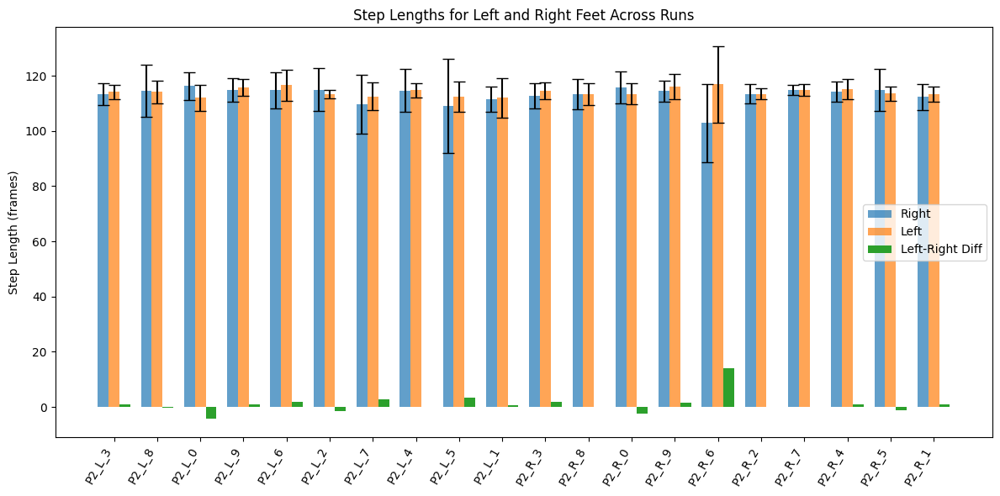

In [14]:
# Compare step lengths for left and right feet across runs in bar plots (Right, Left, difference left-right)

labels = []
right_means = []
right_stds = []
left_means = []
left_stds = []
diffs = []

for dir_label, runs in run_step_data.items():
    for run_key, step_metrics in runs.items():
        step_start_right = step_metrics["step_start_right"]
        step_start_left = step_metrics["step_start_left"]
        step_numbers = min(len(step_start_right), len(step_start_left)) - 1
        if step_numbers < 1:
            continue

        step_length_right = np.array([
            step_start_right[m+1] - step_start_right[m] for m in range(step_numbers)
        ])
        step_length_left = np.array([
            step_start_left[m+1] - step_start_left[m] for m in range(step_numbers)
        ])

        right_means.append(np.mean(step_length_right))
        right_stds.append(np.std(step_length_right))
        left_means.append(np.mean(step_length_left))
        left_stds.append(np.std(step_length_left))
        diffs.append(np.mean(step_length_left) - np.mean(step_length_right))

        # label includes both directory and run id
        labels.append(f"{dir_label}_{run_key}")

x = np.arange(len(labels))
bar_width = 0.25

plt.figure(figsize=(12, 6))
plt.bar(x - bar_width, right_means, width=bar_width, label='Right',
        yerr=right_stds, capsize=5, alpha=0.7)
plt.bar(x, left_means, width=bar_width, label='Left',
        yerr=left_stds, capsize=5, alpha=0.7)
plt.bar(x + bar_width, diffs, width=bar_width, label='Left-Right Diff')

plt.xticks(x, labels, rotation=60, ha="right")
plt.ylabel('Step Length (frames)')
plt.title('Step Lengths for Left and Right Feet Across Runs')
plt.legend()
plt.tight_layout()
plt.show()
plt.close()



# print('right_means', right_means)
# print('left_means', left_means)
# print('diff_means', np.array(right_means) - np.array(left_means))

# print('right_stds', right_stds)
# print('left_stds', left_stds)
# print('diff_stds', np.array(right_stds) - np.array(left_stds))

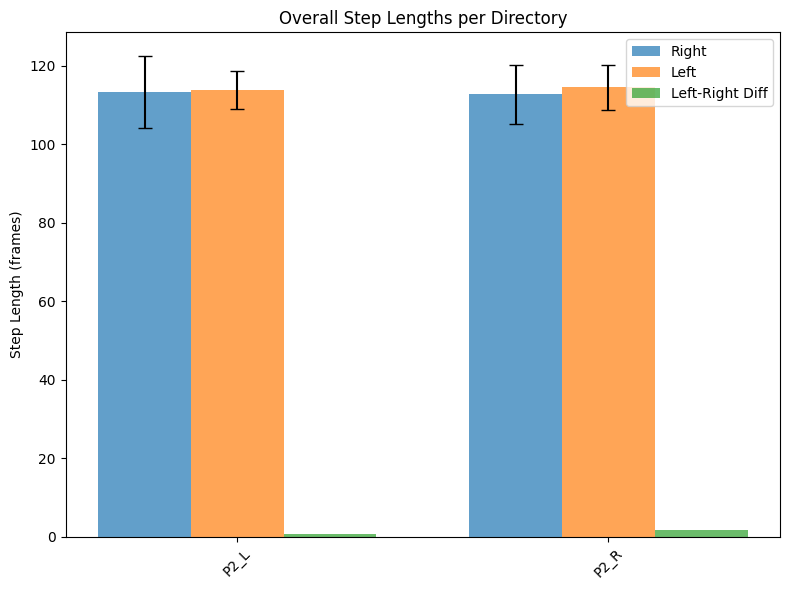

In [15]:
# Step length in meter per directory (summed over runs inside each dir)
dir_stats = {}

for dir_label, runs in run_step_data.items():
    all_step_lengths_right = []
    all_step_lengths_left = []

    for run_key, step_metrics in runs.items():
        step_start_right = step_metrics["step_start_right"]
        step_start_left = step_metrics["step_start_left"]
        step_numbers = min(len(step_start_right), len(step_start_left)) - 1
        if step_numbers < 1:
            continue

        step_length_right = [
            step_start_right[m+1] - step_start_right[m] for m in range(step_numbers)
        ]
        step_length_left = [
            step_start_left[m+1] - step_start_left[m] for m in range(step_numbers)
        ]

        all_step_lengths_right.extend(step_length_right)
        all_step_lengths_left.extend(step_length_left)

    # Convert to numpy arrays
    all_step_lengths_right = np.array(all_step_lengths_right)
    all_step_lengths_left = np.array(all_step_lengths_left)

    # Calculate statistics for this dir
    right_mean, right_std = np.mean(all_step_lengths_right), np.std(all_step_lengths_right)
    left_mean, left_std = np.mean(all_step_lengths_left), np.std(all_step_lengths_left)
    diff_mean = left_mean - right_mean

    dir_stats[dir_label] = {
        "right_mean": right_mean, "right_std": right_std,
        "left_mean": left_mean, "left_std": left_std,
        "diff_mean": diff_mean
    }

# ---- Plotting: compare dirs ----
bar_width = 0.25
x = np.arange(len(dir_stats))

plt.figure(figsize=(8, 6))

plt.bar(x - bar_width, [d["right_mean"] for d in dir_stats.values()],
        width=bar_width, yerr=[d["right_std"] for d in dir_stats.values()],
        capsize=5, alpha=0.7, label="Right")

plt.bar(x, [d["left_mean"] for d in dir_stats.values()],
        width=bar_width, yerr=[d["left_std"] for d in dir_stats.values()],
        capsize=5, alpha=0.7, label="Left")

plt.bar(x + bar_width, [d["diff_mean"] for d in dir_stats.values()],
        width=bar_width, alpha=0.7, label="Left-Right Diff")

plt.xticks(x, list(dir_stats.keys()), rotation=45)
plt.ylabel("Step Length (frames)")
plt.title("Overall Step Lengths per Directory")
plt.legend()
plt.tight_layout()
plt.show()
plt.close()




In [16]:
# Contact Length
# Compare step lengths for left and right feet across runs in bar plots (Right, Left, difference left-right)
labels = []
right_contact_means = []
right_contact_stds = []
left_contact_means = []
left_contact_stds = []
right_swing_means = []
right_swing_stds = []
left_swing_means = []
left_swing_stds = []
diffs_contact = []
diffs_swing = []

for run_key in all_loaded_data.keys():
    step_start_right = run_step_data[run_key]["step_start_right"]
    step_start_left = run_step_data[run_key]["step_start_left"]
    contact_length_right = run_step_data[run_key]["contact_length_right"]
    contact_length_left = run_step_data[run_key]["contact_length_left"]
    print('run_key: ', run_key)
    print('contact_length_right ', contact_length_right)
    print('step_start_right ', step_start_right)

    step_numbers = min(len(step_start_right), len(step_start_left)) - 1
    if step_numbers < 1:
        continue

    step_lengths_right = [step_start_right[i + 1] - step_start_right[i] for i in range(step_numbers)]
    step_lengths_left = [step_start_left[i + 1] - step_start_left[i] for i in range(step_numbers)]

    swing_length_right = [sl - cl for sl, cl in zip(step_lengths_right, contact_length_right[:step_numbers])]
    swing_length_left = [sl - cl for sl, cl in zip(step_lengths_left, contact_length_left[:step_numbers])]

    right_contact_means.append(np.mean(contact_length_right))
    right_contact_stds.append(np.std(contact_length_right))
    left_contact_means.append(np.mean(contact_length_left))
    left_contact_stds.append(np.std(contact_length_left))
    right_swing_means.append(np.mean(swing_length_right))
    right_swing_stds.append(np.std(swing_length_right))
    left_swing_means.append(np.mean(swing_length_left))
    left_swing_stds.append(np.std(swing_length_left))
    diffs_contact.append(np.mean(contact_length_left) - np.mean(contact_length_right))
    diffs_swing.append(np.mean(swing_length_left) - np.mean(swing_length_right))
    labels.append(run_key)


x = np.arange(len(labels))
bar_width = 0.25

plt.figure(figsize=(12, 6))
plt.bar(x - bar_width, right_contact_means, width=bar_width, label='Right Contact', yerr=right_contact_stds, capsize=5, alpha=0.7)
plt.bar(x, left_contact_means, width=bar_width, label='Left Contact', yerr=left_contact_stds, capsize=5, alpha=0.7)
plt.bar(x + bar_width, diffs_contact, width=bar_width, label='Contact Diff')
plt.xticks(x, labels, rotation=45)
plt.ylabel('Contact Length (frames)')
plt.title('Contact Lengths Across Runs')
plt.legend()
plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 6))
plt.bar(x - bar_width, right_swing_means, width=bar_width, label='Right Swing', yerr=right_swing_stds, capsize=5, alpha=0.7)
plt.bar(x, left_swing_means, width=bar_width, label='Left Swing', yerr=left_swing_stds, capsize=5, alpha=0.7)
plt.bar(x + bar_width, diffs_swing, width=bar_width, label='Swing Diff')
plt.xticks(x, labels, rotation=45)
plt.ylabel('Swing Length (frames)')
plt.title('Swing Lengths Across Runs')
plt.legend()
plt.tight_layout()
plt.show()

print('diffs_contact', diffs_contact)
print('diff_swing', diffs_swing)

# print('right_means', right_means)
# print('left_means', left_means)
# print('diff_means', np.array(right_means) - np.array(left_means))

# print('right_stds', right_stds)
# print('left_stds', left_stds)
# print('diff_stds', np.array(right_stds) - np.array(left_stds))

def format_mean_std(mean_list, std_list):
    return [f"{m:.1f} ± {s:.1f}" for m, s in zip(mean_list, std_list)]

import pandas as pd

df = pd.DataFrame({
    "Run": labels,
    "Right Contact Length": format_mean_std(right_contact_means, right_contact_stds),
    "Left Contact Length": format_mean_std(left_contact_means, left_contact_stds),
    "Right Swing Length": format_mean_std(right_swing_means, right_swing_stds),
    "Left Swing Length": format_mean_std(left_swing_means, left_swing_stds),
})

print(df.to_markdown(index=False))


KeyError: 'step_start_right'

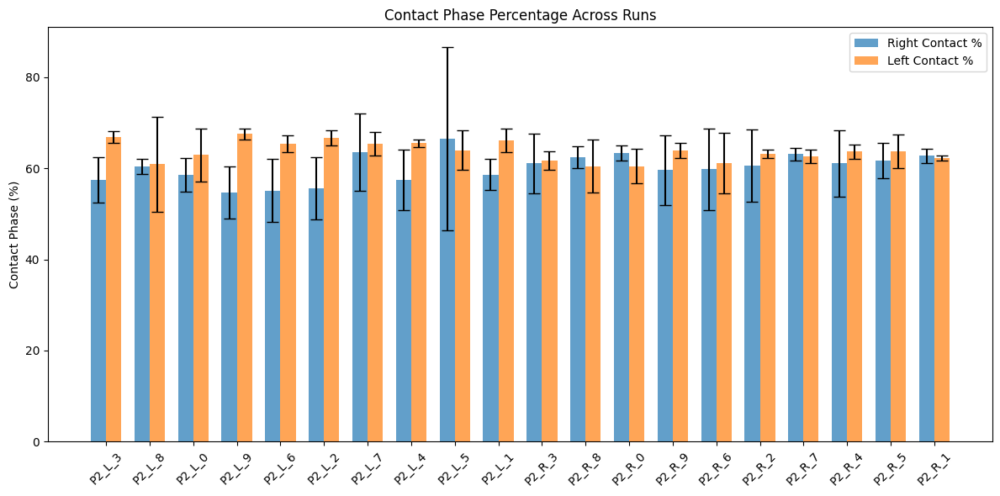

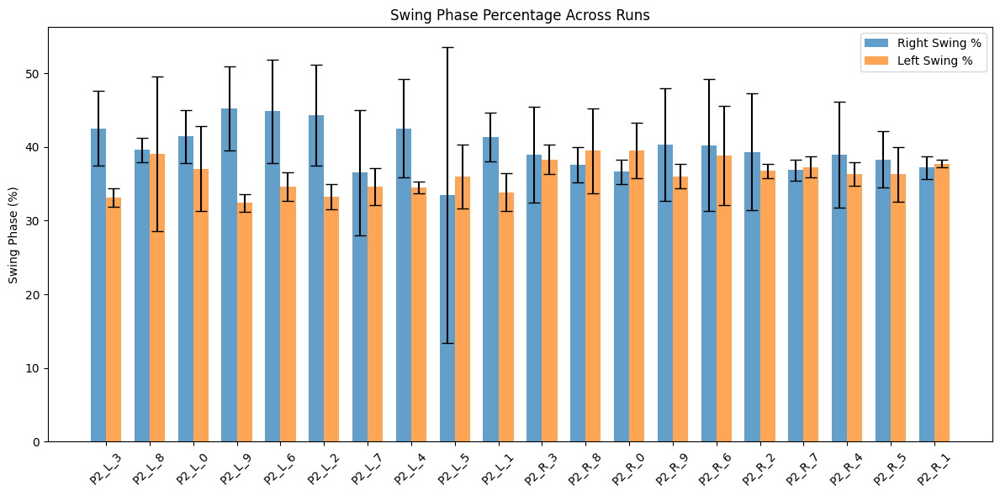

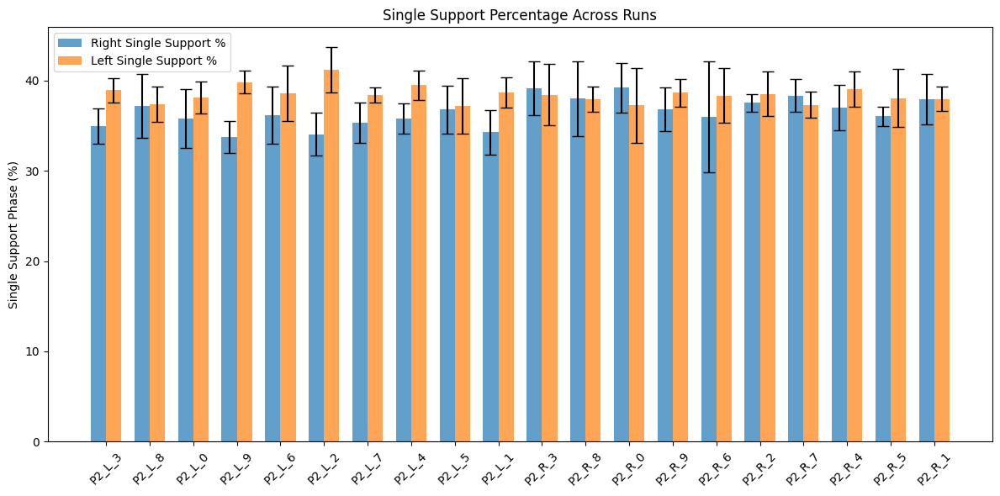

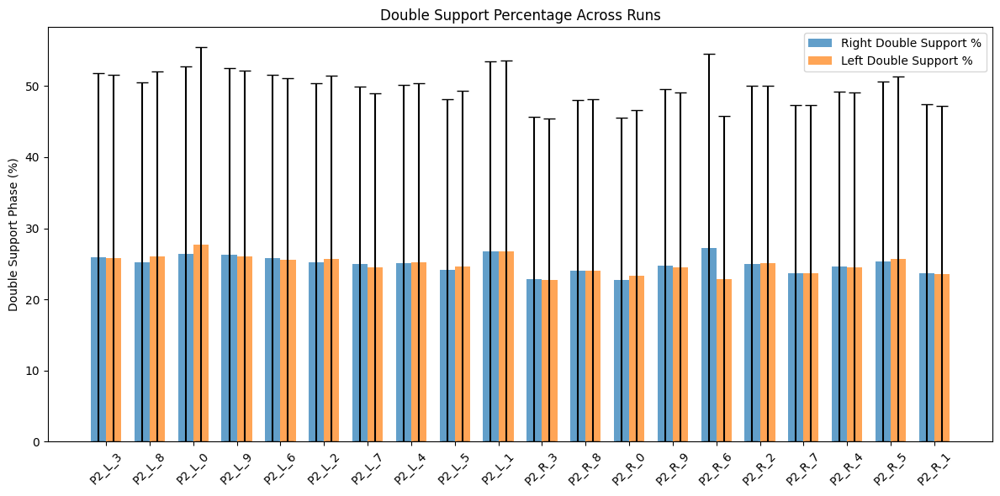

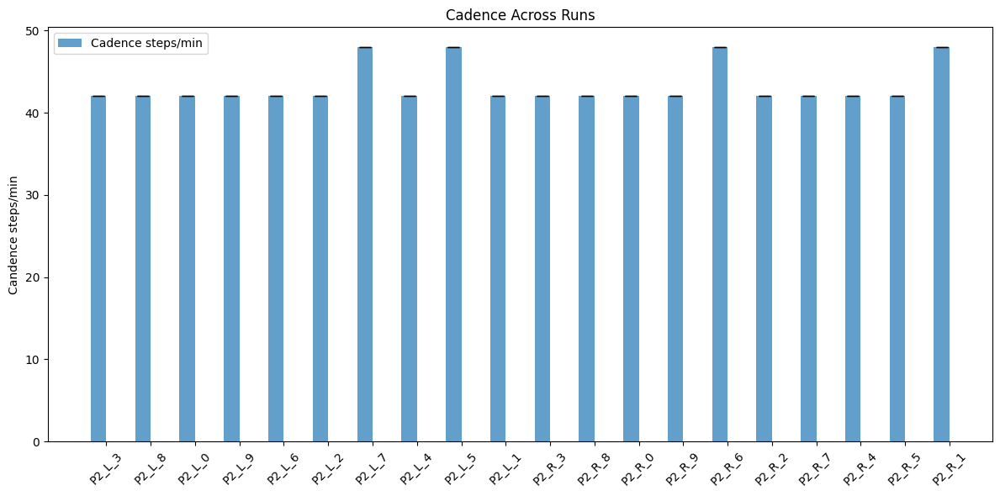

In [17]:
labels = []
right_contact_percents = []
left_contact_percents = []
right_swing_percents = []
left_swing_percents = []
right_single_support_percents = []
left_single_support_percents = []
step_cadence_per_minute_percents = []
right_double_support_percents = []
left_double_support_percents = []

right_contact_percents_std = []
left_contact_percents_std = []
right_swing_percents_std = []
left_swing_percents_std = []
right_single_support_percents_std = []
left_single_support_percents_std = []
right_double_support_percents_std = []
left_double_support_percents_std = []
step_cadence_per_minute_percents_std = []

# Loop over directories and runs
for dir_label, runs in all_loaded_data.items():
    for run_key in runs.keys():
        step_start_right = run_step_data[dir_label][run_key]["step_start_right"]
        step_start_left = run_step_data[dir_label][run_key]["step_start_left"]
        contact_length_right = run_step_data[dir_label][run_key]["contact_length_right"]
        contact_length_left = run_step_data[dir_label][run_key]["contact_length_left"]
        single_support_right = run_step_data[dir_label][run_key]["single_support_right_per_step"]
        single_support_left = run_step_data[dir_label][run_key]["single_support_left_per_step"]
        double_support_time_per_step = run_step_data[dir_label][run_key]["double_support_per_step"]
        step_cadence_per_minute = run_step_data[dir_label][run_key]["step_cadence_per_minute"]

        step_numbers = min(len(step_start_right), len(step_start_left)) - 1
        if step_numbers < 1:
            continue

        # Compute step lengths
        step_lengths_right = [step_start_right[i + 1] - step_start_right[i] for i in range(step_numbers)]
        step_lengths_left = [step_start_left[i + 1] - step_start_left[i] for i in range(step_numbers)]

        # Compute contact percentages
        contact_percent_right = [cl / sl * 100 for cl, sl in zip(contact_length_right[:step_numbers], step_lengths_right)]
        contact_percent_left = [cl / sl * 100 for cl, sl in zip(contact_length_left[:step_numbers], step_lengths_left)]

        # Compute swing percentages
        swing_percent_right = [100 - cp for cp in contact_percent_right]
        swing_percent_left = [100 - cp for cp in contact_percent_left]

        # Compute single support percentages
        single_support_percent_right = [cl / sl * 100 for cl, sl in zip(single_support_right[:step_numbers], step_lengths_right)]
        single_support_percent_left = [cl / sl * 100 for cl, sl in zip(single_support_left[:step_numbers], step_lengths_left)]

        # Compute double support percentages
        double_support_percent_right = [ds / sl * 100 for ds, sl in zip(double_support_time_per_step[:step_numbers], step_lengths_right)]
        double_support_percent_left = [ds / sl * 100 for ds, sl in zip(double_support_time_per_step[:step_numbers], step_lengths_left)]


        # Store means and stds
        right_contact_percents.append(np.mean(contact_percent_right))
        left_contact_percents.append(np.mean(contact_percent_left))
        right_swing_percents.append(np.mean(swing_percent_right))
        left_swing_percents.append(np.mean(swing_percent_left))
        right_single_support_percents.append(np.mean(single_support_percent_right))
        left_single_support_percents.append(np.mean(single_support_percent_left))
        step_cadence_per_minute_percents.append(np.mean(step_cadence_per_minute))
        right_double_support_percents.append(np.mean(double_support_percent_right))
        left_double_support_percents.append(np.mean(double_support_percent_left))

        right_contact_percents_std.append(np.std(contact_percent_right))
        left_contact_percents_std.append(np.std(contact_percent_left))
        right_swing_percents_std.append(np.std(swing_percent_right))
        left_swing_percents_std.append(np.std(swing_percent_left))
        right_single_support_percents_std.append(np.std(single_support_percent_right))
        left_single_support_percents_std.append(np.std(single_support_percent_left))
        step_cadence_per_minute_percents_std.append(np.std(step_cadence_per_minute))
        right_double_support_percents_std.append(np.mean(double_support_percent_right))
        left_double_support_percents_std.append(np.mean(double_support_percent_left))

        labels.append(f"{dir_label}_{run_key}")  # include dir in label to distinguish runs

# ---- Plotting ----
x = np.arange(len(labels))
bar_width = 0.35

# Contact phase %
plt.figure(figsize=(12, 6))
plt.bar(x - bar_width/2, right_contact_percents, yerr=right_contact_percents_std, capsize=5,
        width=bar_width, label='Right Contact %', alpha=0.7)
plt.bar(x + bar_width/2, left_contact_percents, yerr=left_contact_percents_std, capsize=5,
        width=bar_width, label='Left Contact %', alpha=0.7)
plt.xticks(x, labels, rotation=45)
plt.ylabel('Contact Phase (%)')
plt.title('Contact Phase Percentage Across Runs')
plt.legend()
plt.tight_layout()
plt.show()

# Swing phase %
plt.figure(figsize=(12, 6))
plt.bar(x - bar_width/2, right_swing_percents, yerr=right_swing_percents_std, capsize=5,
        width=bar_width, label='Right Swing %', alpha=0.7)
plt.bar(x + bar_width/2, left_swing_percents, yerr=left_swing_percents_std, capsize=5,
        width=bar_width, label='Left Swing %', alpha=0.7)
plt.xticks(x, labels, rotation=45)
plt.ylabel('Swing Phase (%)')
plt.title('Swing Phase Percentage Across Runs')
plt.legend()
plt.tight_layout()
plt.show()

# Single support %
plt.figure(figsize=(12, 6))
plt.bar(x - bar_width/2, right_single_support_percents, yerr=right_single_support_percents_std, capsize=5,
        width=bar_width, label='Right Single Support %', alpha=0.7)
plt.bar(x + bar_width/2, left_single_support_percents, yerr=left_single_support_percents_std, capsize=5,
        width=bar_width, label='Left Single Support %', alpha=0.7)
plt.xticks(x, labels, rotation=45)
plt.ylabel('Single Support Phase (%)')
plt.title('Single Support Percentage Across Runs')
plt.legend()
plt.tight_layout()
plt.show()



# Double support % 
plt.figure(figsize=(12,6))
plt.bar(x - bar_width/2, right_double_support_percents, yerr=right_double_support_percents_std, capsize=5,
        width=bar_width, label='Right Double Support %', alpha=0.7)
plt.bar(x + bar_width/2, left_double_support_percents, yerr=left_double_support_percents_std, capsize=5,
        width=bar_width, label='Left Double Support %', alpha=0.7)
plt.xticks(x, labels, rotation=45)
plt.ylabel('Double Support Phase (%)')
plt.title('Double Support Percentage Across Runs')
plt.legend()
plt.tight_layout()
plt.show()


# Step cadence per minute 
plt.figure(figsize=(12, 6))
plt.bar(x - bar_width/2, step_cadence_per_minute_percents, yerr=step_cadence_per_minute_percents_std, capsize=5,
        width=bar_width, label='Cadence steps/min', alpha=0.7)
# plt.bar(x + bar_width/2, left_double_support_percents, yerr=left_double_support_percents_std, capsize=5,
#         width=bar_width, label='Left Single Support %', alpha=0.7)
plt.xticks(x, labels, rotation=45)
plt.ylabel('Candence steps/min')
plt.title('Cadence Across Runs')
plt.legend()
plt.tight_layout()
plt.show()



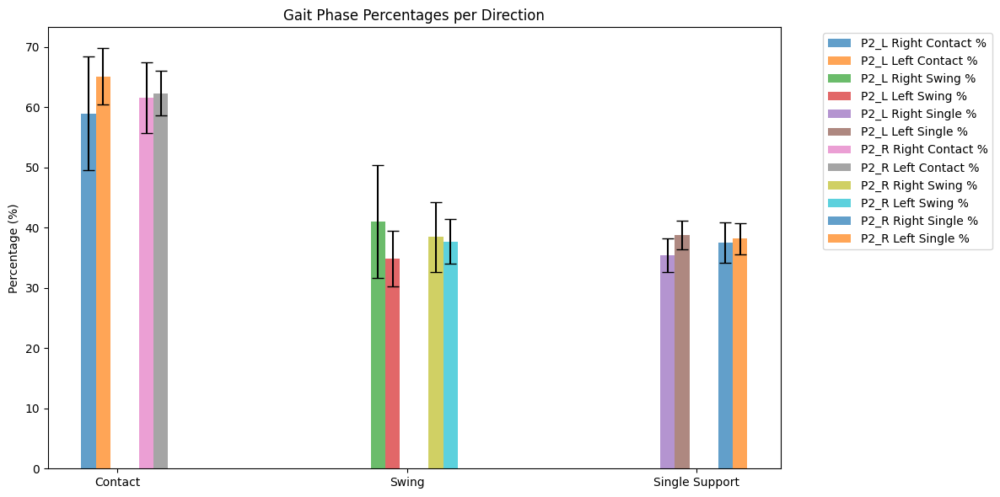

In [18]:
# Contact length, Swing Length, Single Support Length in % summed up over all runs 
# Contact length, Swing Length, Single Support Length in % summed up over runs
import numpy as np
import matplotlib.pyplot as plt

# Store global per-direction values
dir_results = {}

for dir_key, runs in all_loaded_data.items():
    all_contact_percent_right = []
    all_contact_percent_left = []
    all_swing_percent_right = []
    all_swing_percent_left = []
    all_single_support_percent_right = []
    all_single_support_percent_left = []

    for run_key, run_data in runs.items():
        step_start_right = run_step_data[dir_key][run_key]["step_start_right"]
        step_start_left = run_step_data[dir_key][run_key]["step_start_left"]
        contact_length_right = run_step_data[dir_key][run_key]["contact_length_right"]
        contact_length_left = run_step_data[dir_key][run_key]["contact_length_left"]
        single_support_right = run_step_data[dir_key][run_key]["single_support_right_per_step"]
        single_support_left = run_step_data[dir_key][run_key]["single_support_left_per_step"]

        step_numbers = min(len(step_start_right), len(step_start_left)) - 1
        if step_numbers < 1:
            continue

        step_lengths_right = [step_start_right[i + 1] - step_start_right[i] for i in range(step_numbers)]
        step_lengths_left = [step_start_left[i + 1] - step_start_left[i] for i in range(step_numbers)]

        contact_percent_right = [cl / sl * 100 for cl, sl in zip(contact_length_right[:step_numbers], step_lengths_right)]
        contact_percent_left = [cl / sl * 100 for cl, sl in zip(contact_length_left[:step_numbers], step_lengths_left)]

        swing_percent_right = [100 - cp for cp in contact_percent_right]
        swing_percent_left = [100 - cp for cp in contact_percent_left]

        single_support_percent_right = [cl / sl * 100 for cl, sl in zip(single_support_right[:step_numbers], step_lengths_right)]
        single_support_percent_left = [cl / sl * 100 for cl, sl in zip(single_support_left[:step_numbers], step_lengths_left)]

        # Collect all values for this direction
        all_contact_percent_right.extend(contact_percent_right)
        all_contact_percent_left.extend(contact_percent_left)
        all_swing_percent_right.extend(swing_percent_right)
        all_swing_percent_left.extend(swing_percent_left)
        all_single_support_percent_right.extend(single_support_percent_right)
        all_single_support_percent_left.extend(single_support_percent_left)

    # Save per-direction statistics
    dir_results[dir_key] = {
        "contact_right": (np.mean(all_contact_percent_right), np.std(all_contact_percent_right)),
        "contact_left":  (np.mean(all_contact_percent_left), np.std(all_contact_percent_left)),
        "swing_right":   (np.mean(all_swing_percent_right), np.std(all_swing_percent_right)),
        "swing_left":    (np.mean(all_swing_percent_left), np.std(all_swing_percent_left)),
        "single_right":  (np.mean(all_single_support_percent_right), np.std(all_single_support_percent_right)),
        "single_left":   (np.mean(all_single_support_percent_left), np.std(all_single_support_percent_left)),
    }

# === Plot grouped by direction ===
bar_width = 0.05 #0.2
x = np.arange(3)  # Contact, Swing, Single Support

plt.figure(figsize=(12, 6))

for i, (dir_key, stats) in enumerate(dir_results.items()):
    offset = i * (bar_width * 2 + 0.1)  # separate groups by dir

    plt.bar(x[0] + offset - bar_width/2, stats["contact_right"][0], 
            yerr=stats["contact_right"][1], capsize=5, width=bar_width, 
            label=f'{dir_key} Right Contact %', alpha=0.7)
    plt.bar(x[0] + offset + bar_width/2, stats["contact_left"][0], 
            yerr=stats["contact_left"][1], capsize=5, width=bar_width, 
            label=f'{dir_key} Left Contact %', alpha=0.7)

    plt.bar(x[1] + offset - bar_width/2, stats["swing_right"][0], 
            yerr=stats["swing_right"][1], capsize=5, width=bar_width, 
            label=f'{dir_key} Right Swing %', alpha=0.7)
    plt.bar(x[1] + offset + bar_width/2, stats["swing_left"][0], 
            yerr=stats["swing_left"][1], capsize=5, width=bar_width, 
            label=f'{dir_key} Left Swing %', alpha=0.7)

    plt.bar(x[2] + offset - bar_width/2, stats["single_right"][0], 
            yerr=stats["single_right"][1], capsize=5, width=bar_width, 
            label=f'{dir_key} Right Single %', alpha=0.7)
    plt.bar(x[2] + offset + bar_width/2, stats["single_left"][0], 
            yerr=stats["single_left"][1], capsize=5, width=bar_width, 
            label=f'{dir_key} Left Single %', alpha=0.7)

plt.xticks(x + (len(dir_results) - 1) * (bar_width + 0.1) / 2, ['Contact', 'Swing', 'Single Support'])
plt.ylabel('Percentage (%)')
plt.title('Gait Phase Percentages per Direction')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


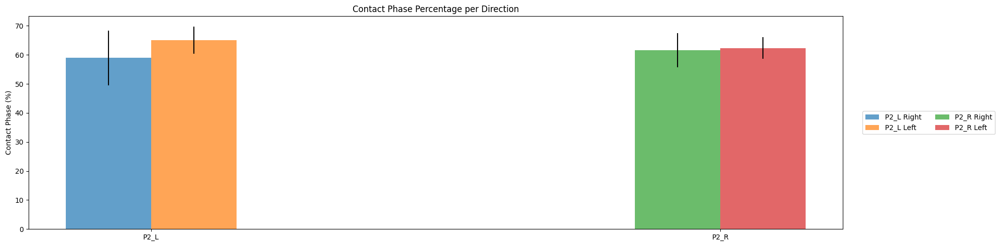

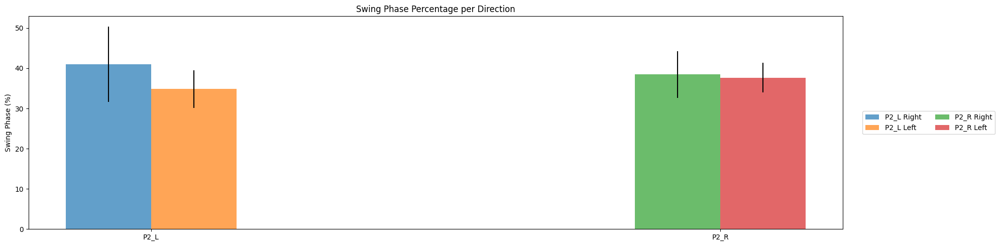

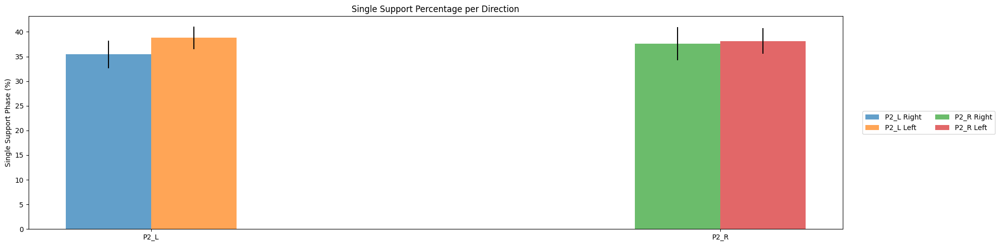

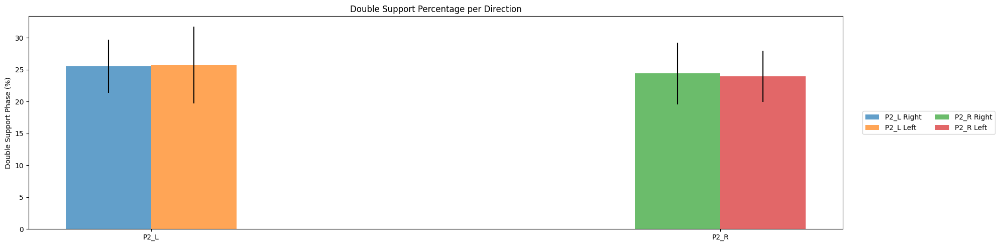

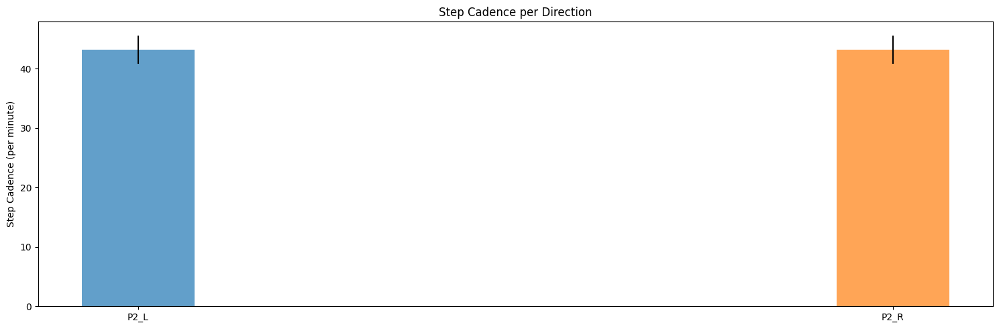

In [19]:
# Contact length, Swing Length, Single Support Length in % summed up over all runs 
# Contact length, Swing Length, Single Support Length in % summed up over runs
# Plot each parameter (Contact %, Swing %, Single Support %) in a separate figure

# Store global per-direction values
dir_results = {}

for dir_key, runs in all_loaded_data.items():
    all_contact_percent_right = []
    all_contact_percent_left = []
    all_swing_percent_right = []
    all_swing_percent_left = []
    all_single_support_percent_right = []
    all_single_support_percent_left = []
    all_double_support_percent_right = []
    all_double_support_percent_left = []
    all_step_cadence = []

    for run_key, run_data in runs.items():
        step_start_right = run_step_data[dir_key][run_key]["step_start_right"]
        step_start_left = run_step_data[dir_key][run_key]["step_start_left"]
        contact_length_right = run_step_data[dir_key][run_key]["contact_length_right"]
        contact_length_left = run_step_data[dir_key][run_key]["contact_length_left"]
        single_support_right = run_step_data[dir_key][run_key]["single_support_right_per_step"]
        single_support_left = run_step_data[dir_key][run_key]["single_support_left_per_step"]
        double_support_time_per_step = run_step_data[dir_key][run_key]["double_support_per_step"]
        step_cadence_per_minute = run_step_data[dir_key][run_key]["step_cadence_per_minute"]

        step_numbers = min(len(step_start_right), len(step_start_left)) - 1
        if step_numbers < 1:
            continue

        step_lengths_right = [step_start_right[i + 1] - step_start_right[i] for i in range(step_numbers)]
        step_lengths_left = [step_start_left[i + 1] - step_start_left[i] for i in range(step_numbers)]

        contact_percent_right = [cl / sl * 100 for cl, sl in zip(contact_length_right[:step_numbers], step_lengths_right)]
        contact_percent_left = [cl / sl * 100 for cl, sl in zip(contact_length_left[:step_numbers], step_lengths_left)]

        swing_percent_right = [100 - cp for cp in contact_percent_right]
        swing_percent_left = [100 - cp for cp in contact_percent_left]

        single_support_percent_right = [cl / sl * 100 for cl, sl in zip(single_support_right[:step_numbers], step_lengths_right)]
        single_support_percent_left = [cl / sl * 100 for cl, sl in zip(single_support_left[:step_numbers], step_lengths_left)]

        double_support_percent_right = [ds / sl * 100 for ds, sl in zip(double_support_time_per_step[:step_numbers], step_lengths_right)]
        double_support_percent_left = [ds / sl * 100 for ds, sl in zip(double_support_time_per_step[:step_numbers], step_lengths_left)]

        # Collect all values for this direction
        all_contact_percent_right.extend(contact_percent_right)
        all_contact_percent_left.extend(contact_percent_left)
        all_swing_percent_right.extend(swing_percent_right)
        all_swing_percent_left.extend(swing_percent_left)
        all_single_support_percent_right.extend(single_support_percent_right)
        all_single_support_percent_left.extend(single_support_percent_left)
        all_double_support_percent_right.extend(double_support_percent_right)
        all_double_support_percent_left.extend(double_support_percent_left)
        if isinstance(step_cadence_per_minute, (list, np.ndarray)):
            all_step_cadence.extend(step_cadence_per_minute)
        else:
            all_step_cadence.append(step_cadence_per_minute)

    # Save per-direction statistics
    dir_results[dir_key] = {
        "contact_right": (np.mean(all_contact_percent_right), np.std(all_contact_percent_right)),
        "contact_left":  (np.mean(all_contact_percent_left), np.std(all_contact_percent_left)),
        "swing_right":   (np.mean(all_swing_percent_right), np.std(all_swing_percent_right)),
        "swing_left":    (np.mean(all_swing_percent_left), np.std(all_swing_percent_left)),
        "single_right":  (np.mean(all_single_support_percent_right), np.std(all_single_support_percent_right)),
        "single_left":   (np.mean(all_single_support_percent_left), np.std(all_single_support_percent_left)),
        "double_right":  (np.mean(all_double_support_percent_right), np.std(all_double_support_percent_right)),
        "double_left":   (np.mean(all_double_support_percent_left), np.std(all_double_support_percent_left)),
        "cadence":       (np.mean(all_step_cadence), np.std(all_step_cadence)),
    }

bar_width = 0.15
x = np.arange(len(dir_results))

# Contact %
plt.figure(figsize=(20, 5))
for i, (dir_key, stats) in enumerate(dir_results.items()):
    plt.bar(x[i] - bar_width/2, stats["contact_right"][0], yerr=stats["contact_right"][1], width=bar_width, label=f'{dir_key} Right', alpha=0.7)
    plt.bar(x[i] + bar_width/2, stats["contact_left"][0], yerr=stats["contact_left"][1], width=bar_width, label=f'{dir_key} Left', alpha=0.7)
plt.xticks(x, list(dir_results.keys()))
plt.ylabel('Contact Phase (%)')
plt.title('Contact Phase Percentage per Direction')
plt.legend(ncol=2, bbox_to_anchor=(1.02, 0.5), loc='center left')
plt.tight_layout()
plt.show()

# Swing %
plt.figure(figsize=(20, 5))
for i, (dir_key, stats) in enumerate(dir_results.items()):
    plt.bar(x[i] - bar_width/2, stats["swing_right"][0], yerr=stats["swing_right"][1], width=bar_width, label=f'{dir_key} Right', alpha=0.7)
    plt.bar(x[i] + bar_width/2, stats["swing_left"][0], yerr=stats["swing_left"][1], width=bar_width, label=f'{dir_key} Left', alpha=0.7)
plt.xticks(x, list(dir_results.keys()))
plt.ylabel('Swing Phase (%)')
plt.title('Swing Phase Percentage per Direction')
plt.legend(ncol=2, bbox_to_anchor=(1.02, 0.5), loc='center left')
plt.tight_layout()
plt.show()

# Single Support %
plt.figure(figsize=(20, 5))
for i, (dir_key, stats) in enumerate(dir_results.items()):
    plt.bar(x[i] - bar_width/2, stats["single_right"][0], yerr=stats["single_right"][1], width=bar_width, label=f'{dir_key} Right', alpha=0.7)
    plt.bar(x[i] + bar_width/2, stats["single_left"][0], yerr=stats["single_left"][1], width=bar_width, label=f'{dir_key} Left', alpha=0.7)
plt.xticks(x, list(dir_results.keys()))
plt.ylabel('Single Support Phase (%)')
plt.title('Single Support Percentage per Direction')
plt.legend(ncol=2, bbox_to_anchor=(1.02, 0.5), loc='center left')
plt.tight_layout()
plt.show()

# Double Support %
plt.figure(figsize=(20, 5))
for i, (dir_key, stats) in enumerate(dir_results.items()):
    plt.bar(x[i] - bar_width/2, stats["double_right"][0], yerr=stats["double_right"][1], width=bar_width, label=f'{dir_key} Right', alpha=0.7)
    plt.bar(x[i] + bar_width/2, stats["double_left"][0], yerr=stats["double_left"][1], width=bar_width, label=f'{dir_key} Left', alpha=0.7)
plt.xticks(x, list(dir_results.keys()))
plt.ylabel('Double Support Phase (%)')
plt.title('Double Support Percentage per Direction')
plt.legend(ncol=2, bbox_to_anchor=(1.02, 0.5), loc='center left')
plt.tight_layout()
plt.show()

# Step Cadence per Minute
plt.figure(figsize=(15, 5))
for i, (dir_key, stats) in enumerate(dir_results.items()):
    plt.bar(x[i], stats["cadence"][0], yerr=stats["cadence"][1], width=bar_width, label=f'{dir_key}', alpha=0.7)
plt.xticks(x, list(dir_results.keys()))
plt.ylabel('Step Cadence (per minute)')
plt.title('Step Cadence per Direction')
# plt.legend(ncol=len(plt.gca().get_legend_handles_labels()[1]), loc='upper center', bbox_to_anchor=(0.5, 1.15))
plt.tight_layout()
plt.show()

In [21]:
import pandas as pd

def format_mean_std(mean_list, std_list):
    return [f"{m:.1f} ± {s:.1f}" for m, s in zip(mean_list, std_list)]

# Compute standard deviations
right_contact_stds = [np.std([cl / sl * 100 for cl, sl in zip(run_step_data[run]["contact_length_right"][:min(len(run_step_data[run]["step_start_right"]) - 1, len(run_step_data[run]["step_start_left"]) - 1)], 
                                                          [run_step_data[run]["step_start_right"][i + 1] - run_step_data[run]["step_start_right"][i] 
                                                           for i in range(min(len(run_step_data[run]["step_start_right"]) - 1, len(run_step_data[run]["step_start_left"]) - 1))])]) 
                      for run in labels]

left_contact_stds = [np.std([cl / sl * 100 for cl, sl in zip(run_step_data[run]["contact_length_left"][:min(len(run_step_data[run]["step_start_right"]) - 1, len(run_step_data[run]["step_start_left"]) - 1)], 
                                                         [run_step_data[run]["step_start_left"][i + 1] - run_step_data[run]["step_start_left"][i] 
                                                          for i in range(min(len(run_step_data[run]["step_start_right"]) - 1, len(run_step_data[run]["step_start_left"]) - 1))])]) 
                     for run in labels]

right_swing_stds = [np.std([100 - cp for cp in [cl / sl * 100 for cl, sl in zip(run_step_data[run]["contact_length_right"][:min(len(run_step_data[run]["step_start_right"]) - 1, len(run_step_data[run]["step_start_left"]) - 1)], 
                                                                 [run_step_data[run]["step_start_right"][i + 1] - run_step_data[run]["step_start_right"][i] 
                                                                  for i in range(min(len(run_step_data[run]["step_start_right"]) - 1, len(run_step_data[run]["step_start_left"]) - 1))])]]) 
                     for run in labels]

left_swing_stds = [np.std([100 - cp for cp in [cl / sl * 100 for cl, sl in zip(run_step_data[run]["contact_length_left"][:min(len(run_step_data[run]["step_start_right"]) - 1, len(run_step_data[run]["step_start_left"]) - 1)], 
                                                                [run_step_data[run]["step_start_left"][i + 1] - run_step_data[run]["step_start_left"][i] 
                                                                 for i in range(min(len(run_step_data[run]["step_start_right"]) - 1, len(run_step_data[run]["step_start_left"]) - 1))])]]) 
                    for run in labels]

right_single_support_stds = [np.std([cl / sl * 100 for cl, sl in zip(run_step_data[run]["single_support_right_per_step"][:min(len(run_step_data[run]["step_start_right"]) - 1, len(run_step_data[run]["step_start_left"]) - 1)], 
                                                          [run_step_data[run]["step_start_right"][i + 1] - run_step_data[run]["step_start_right"][i] 
                                                           for i in range(min(len(run_step_data[run]["step_start_right"]) - 1, len(run_step_data[run]["step_start_left"]) - 1))])]) 
                      for run in labels]

left_single_support_stds = [np.std([cl / sl * 100 for cl, sl in zip(run_step_data[run]["single_support_left_per_step"][:min(len(run_step_data[run]["step_start_right"]) - 1, len(run_step_data[run]["step_start_left"]) - 1)], 
                                                         [run_step_data[run]["step_start_left"][i + 1] - run_step_data[run]["step_start_left"][i] 
                                                          for i in range(min(len(run_step_data[run]["step_start_right"]) - 1, len(run_step_data[run]["step_start_left"]) - 1))])]) 
                     for run in labels]

# Create DataFrame
df = pd.DataFrame({
    "Run": labels,
    "Right Contact % (Mean ± SD)": [f"{mean:.1f} ± {std:.1f}" for mean, std in zip(right_contact_percents, right_contact_stds)],
    "Left Contact % (Mean ± SD)": [f"{mean:.1f} ± {std:.1f}" for mean, std in zip(left_contact_percents, left_contact_stds)],
    "Right Swing % (Mean ± SD)": [f"{mean:.1f} ± {std:.1f}" for mean, std in zip(right_swing_percents, right_swing_stds)],
    "Left Swing % (Mean ± SD)": [f"{mean:.1f} ± {std:.1f}" for mean, std in zip(left_swing_percents, left_swing_stds)],
    "Right Single Support % (Mean ± SD)": [f"{mean:.1f} ± {std:.1f}" for mean, std in zip(right_single_support_percents, right_single_support_stds)],
    "Left Single Support % (Mean ± SD)": [f"{mean:.1f} ± {std:.1f}" for mean, std in zip(left_single_support_percents, left_single_support_stds)],
})

# Print as Markdown table
print(df.to_markdown(index=False))


KeyError: 'P2_L_3'

In [20]:
# import loco_mujoco.evaluation.evaluation_prosthesis as eval_pros

# import importlib
# importlib.reload(eval_pros)

# postprocess_handler = eval_pros.PostProcessMetricsHandler()

# Get Distance of Step in m 
# === Compute step lengths per run ===
for dir_label, runs in all_loaded_data.items():
    for run_number, run_dict in runs.items():
        all_body_poses = np.array(run_dict["all_body_poses"])
        step_start_right = run_step_data[dir_label][run_number]["step_start_right"]
        step_start_left = run_step_data[dir_label][run_number]["step_start_left"]

        step_length_right = postprocess_handler.get_step_distance_length(
            all_body_poses, "toes_r", step_start_right
        )
        step_length_left = postprocess_handler.get_step_distance_length(
            all_body_poses, "toes_l", step_start_left
        )

        run_step_data[dir_label][run_number]["step_length_right_m"] = step_length_right
        run_step_data[dir_label][run_number]["step_length_left_m"] = step_length_left

# === Aggregate statistics ===
right_length_means = []
left_length_means = []
right_length_stds = []
left_length_stds = []
diffs_length_means = []
labels = []

for dir_label, runs in run_step_data.items():
    for run_number, step_dict in runs.items():
        step_length_right = step_dict["step_length_right_m"]
        step_length_left = step_dict["step_length_left_m"]

        mean_right = np.mean(step_length_right)
        mean_left = np.mean(step_length_left)

        right_length_means.append(mean_right)
        right_length_stds.append(np.std(step_length_right))
        left_length_means.append(mean_left)
        left_length_stds.append(np.std(step_length_left))

        diffs_length_means.append(mean_right - mean_left)
        labels.append(f"{dir_label}_{run_number}")

# === Plotting ===
x = np.arange(len(labels))
bar_width = 0.25

plt.figure(figsize=(12, 6))
plt.bar(x - bar_width, right_length_means, width=bar_width, label='Right Step',
        yerr=right_length_stds, capsize=5, alpha=0.7)
plt.bar(x, left_length_means, width=bar_width, label='Left Step',
        yerr=left_length_stds, capsize=5, alpha=0.7)
plt.bar(x + bar_width, diffs_length_means, width=bar_width, label='Right-Left Diff', alpha=0.7)
plt.xticks(x, labels, rotation=45)
plt.ylabel('Step Length (m)')
plt.title('Step Lengths per Run')
plt.legend()
plt.tight_layout()
plt.show()





TypeError: PostProcessMetricsHandler.get_step_distance_length() missing 1 required positional argument: 'step_start_indices_left'

In [22]:
# Step length in m summed up for all runs 
# Collect step lengths from all runs
# === Compute step lengths summed per directory ===
dir_labels = []
dir_right_means = []
dir_left_means = []
dir_right_stds = []
dir_left_stds = []
dir_diff_means = []

for dir_label, runs in all_loaded_data.items():
    all_step_lengths_right = []
    all_step_lengths_left = []

    for run_number, run_dict in runs.items():
        all_body_poses = np.array(run_dict["all_body_poses"])
        step_start_right = run_step_data[dir_label][run_number]["step_start_right"]
        step_start_left = run_step_data[dir_label][run_number]["step_start_left"]

        step_length_right = postprocess_handler.get_step_distance_length(
            all_body_poses, "toes_r", step_start_right
        )
        step_length_left = postprocess_handler.get_step_distance_length(
            all_body_poses, "toes_l", step_start_left
        )

        all_step_lengths_right.extend(step_length_right)
        all_step_lengths_left.extend(step_length_left)

    # Convert to arrays
    all_step_lengths_right = np.array(all_step_lengths_right)
    all_step_lengths_left = np.array(all_step_lengths_left)

    # Compute statistics for this directory
    mean_right = np.mean(all_step_lengths_right)
    std_right = np.std(all_step_lengths_right)
    mean_left = np.mean(all_step_lengths_left)
    std_left = np.std(all_step_lengths_left)
    diff_mean = mean_right - mean_left

    # Store for plotting
    dir_labels.append(dir_label)
    dir_right_means.append(mean_right)
    dir_right_stds.append(std_right)
    dir_left_means.append(mean_left)
    dir_left_stds.append(std_left)
    dir_diff_means.append(diff_mean)

# === Plotting per directory ===
x = np.arange(len(dir_labels))
bar_width = 0.25

plt.figure(figsize=(10, 6))
plt.bar(x - bar_width, dir_right_means, width=bar_width, label='Right Step', yerr=dir_right_stds, capsize=5, alpha=0.7)
plt.bar(x, dir_left_means, width=bar_width, label='Left Step', yerr=dir_left_stds, capsize=5, alpha=0.7)
plt.bar(x + bar_width, dir_diff_means, width=bar_width, label='Right-Left Diff', alpha=0.7)

plt.xticks(x, dir_labels, rotation=45)
plt.ylabel('Step Length (m)')
plt.title('Step Lengths per Directory')
plt.legend()
plt.tight_layout()
plt.show()





TypeError: PostProcessMetricsHandler.get_step_distance_length() missing 1 required positional argument: 'step_start_indices_left'

Sensor data

In [23]:
importlib.reload(eval_pros)

postprocess_handler = eval_pros.PostProcessMetricsHandler()
# def plot_sensor_force_symmetry_all_runs(all_loaded_data, run_step_data, interp_len=100, sensor_force_names=None):
#     """
#     Plot mean, std, and left-right difference for each left/right sensor force pair across all runs.
#     """
#     # Use sensor_force_names from the first run if not provided
#     if sensor_force_names is None:
#         first_run = next(iter(all_loaded_data))
#         sensor_force_names = all_loaded_data[first_run]["sensor_force_names"]

#     # Find sensor pairs (left/right)
#     sensor_pairs = []
#     for name in sensor_force_names:
#         if name.startswith("left_"):
#             right_name = name.replace("left_", "right_")
#             if right_name in sensor_force_names:
#                 sensor_pairs.append((name, right_name))

#     for left_sensor, right_sensor in sensor_pairs:
#         plt.figure(figsize=(12, 6))
#         for run_key in all_loaded_data:
#             run_dict = all_loaded_data[run_key]
#             step_data = run_step_data[run_key]
#             left_data = run_dict["all_sensor_force"][left_sensor]
#             right_data = run_dict["all_sensor_force"][right_sensor]
#             left_steps = []
#             right_steps = []
#             all_step_start_left = step_data["step_start_left"]
#             all_step_start_right = step_data["step_start_right"]

#             # Interpolate left steps
#             if all_step_start_left and len(all_step_start_left) > 1:
#                 for j in range(len(all_step_start_left) - 1):
#                     start, end = all_step_start_left[j], all_step_start_left[j + 1]
#                     y = [float(np.array(a)[1]) for a in left_data[start:end]]
#                     if len(y) < 2:
#                         continue
#                     x_old = np.linspace(0, 1, len(y))
#                     x_new = np.linspace(0, 1, interp_len)
#                     y_interp = np.interp(x_new, x_old, y)
#                     left_steps.append(y_interp)
#             # Interpolate right steps
#             if all_step_start_right and len(all_step_start_right) > 1:
#                 for j in range(len(all_step_start_right) - 1):
#                     start, end = all_step_start_right[j], all_step_start_right[j + 1]
#                     y = [float(np.array(a)[1]) for a in right_data[start:end]]
#                     if len(y) < 2:
#                         continue
#                     x_old = np.linspace(0, 1, len(y))
#                     x_new = np.linspace(0, 1, interp_len)
#                     y_interp = np.interp(x_new, x_old, y)
#                     right_steps.append(y_interp)
#             # Plot if enough steps
#             if left_steps and right_steps:
#                 mean_left = np.mean(left_steps, axis=0)
#                 std_left = np.std(left_steps, axis=0)
#                 mean_right = np.mean(right_steps, axis=0)
#                 std_right = np.std(right_steps, axis=0)
#                 diff = mean_left - mean_right
#                 x = np.linspace(0, 100, interp_len)
#                 plt.plot(x, mean_left, label=f"{run_key} {left_sensor} mean")
#                 plt.fill_between(x, mean_left - std_left, mean_left + std_left, alpha=0.15)
#                 plt.plot(x, mean_right, label=f"{run_key} {right_sensor} mean", linestyle='--')
#                 plt.fill_between(x, mean_right - std_right, mean_right + std_right, alpha=0.15)
#                 plt.plot(x, diff, label=f"{run_key} Left-Right", linestyle=':')
#         plt.axhline(0, color='gray', linestyle=':', linewidth=1)
#         plt.title(f"Force Sensor (y) per time step: {left_sensor} vs {right_sensor} (all runs)")
#         plt.xlabel("Interpolated Step (%)")
#         plt.ylabel("Force Value")
#         plt.legend()
#         plt.tight_layout()
#         plt.show()

direction = "x" # FOR FORCE USE Y ; FOR TORQUE Z HIGHEST!! #### "x" or "y" or "z"
postprocess_handler.plot_sensor_force_symmetry_all_runs(all_loaded_data, run_step_data, direction, interp_len=100,body_weight_to_normalize = 86.6*9.81)

# Force sensor: creates a 3-axis force sensor. The sensor outputs three numbers, which are the interaction 
# force between a child and a parent body, expressed in the site frame defining the sensor. The convention 
# is that the site is attached to the child body, and the force points from the child towards the parent. 
# The computation here takes into account all forces acting on the system, including contacts as well as 
# external perturbations. 

KeyError: 'sensor_force_names'

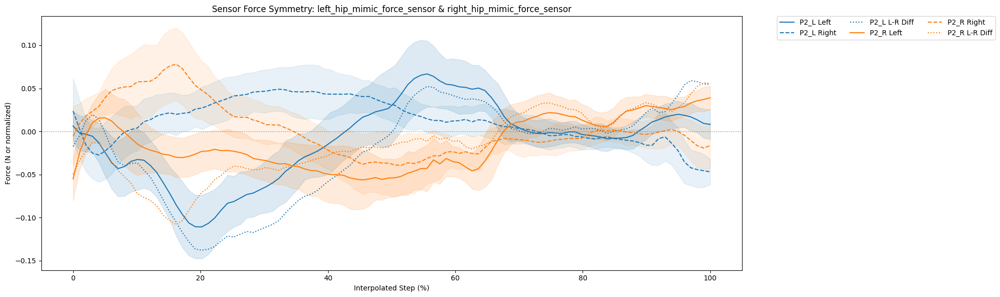

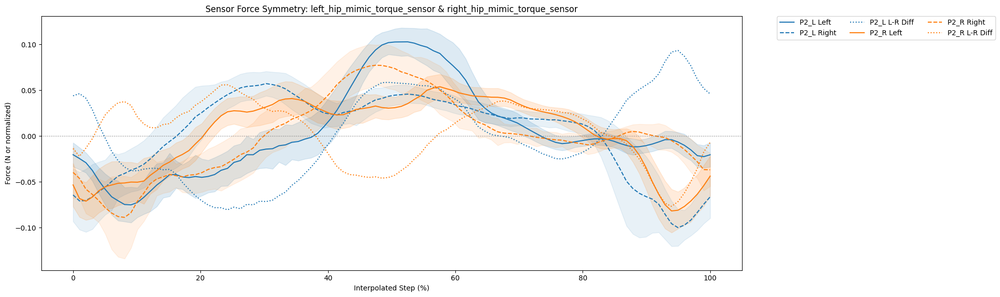

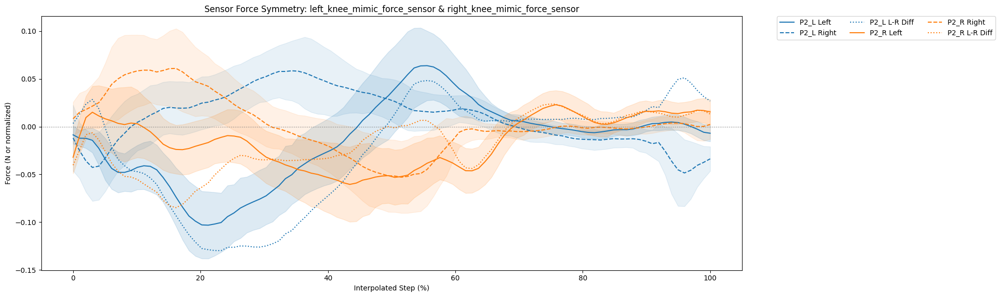

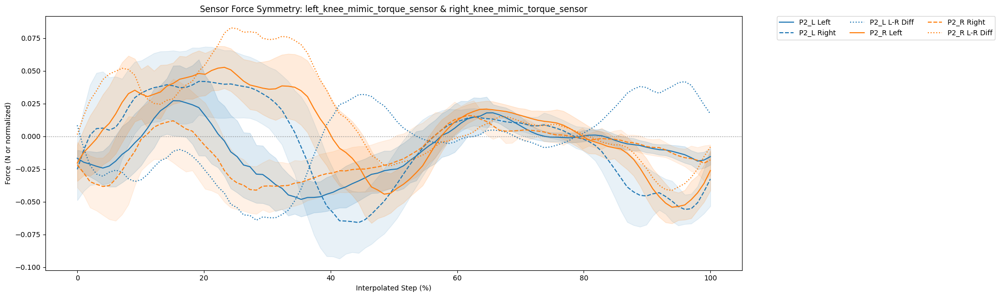

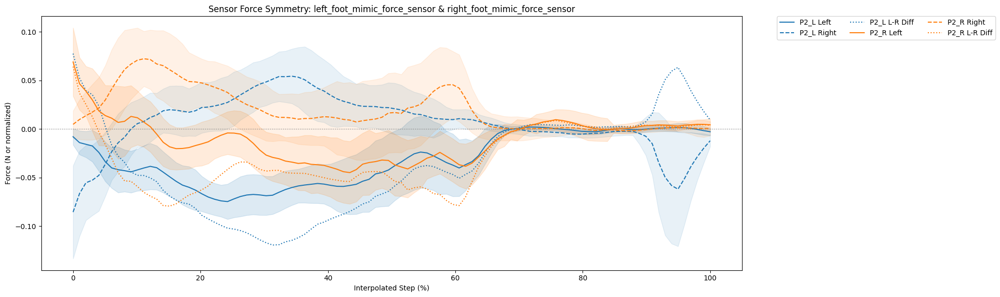

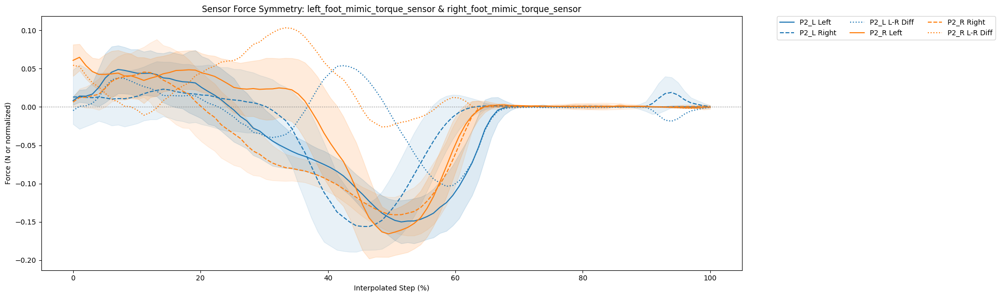

In [24]:
importlib.reload(eval_pros)

postprocess_handler = eval_pros.PostProcessMetricsHandler()


direction = "z" # FOR FORCE USE Y ; FOR TORQUE Z HIGHEST!! #### "x" or "y" or "z"
postprocess_handler.plot_sensor_force_symmetry_summed_all_dirs(all_loaded_data, run_step_data, direction, interp_len=100,body_weight_to_normalize = 86.6*9.81)


GRF 

In [25]:
grf_components = ['Mx', 'My', 'Mz','Fx', 'Fy', 'Fz']  # Adjust if your GRF data has different columns
interp_len = 100

# for comp_idx, comp in enumerate(grf_components):
#     plt.figure(figsize=(12, 6))
#     for run_key in all_loaded_data:
#         run_dict = all_loaded_data[run_key]
#         step_data = run_step_data[run_key]
#         all_grf_l = np.array(run_dict["all_grf_l"])
#         all_grf_r = np.array(run_dict["all_grf_r"])
#         all_step_start_left = step_data["step_start_left"]
#         all_step_start_right = step_data["step_start_right"]

#         # Left steps
#         left_steps = []
#         if all_grf_l is not None and all_step_start_left and len(all_step_start_left) > 1:
#             for j in range(len(all_step_start_left) - 1):
#                 start, end = all_step_start_left[j], all_step_start_left[j + 1]
#                 y = [float(np.array(a)[comp_idx]) for a in all_grf_l[start:end]]
#                 if len(y) < 2:
#                     continue
#                 x_old = np.linspace(0, 1, len(y))
#                 x_new = np.linspace(0, 1, interp_len)
#                 y_interp = np.interp(x_new, x_old, y)
#                 left_steps.append(y_interp)
#         # Right steps
#         right_steps = []
#         if all_grf_r is not None and all_step_start_right and len(all_step_start_right) > 1:
#             for j in range(len(all_step_start_right) - 1):
#                 start, end = all_step_start_right[j], all_step_start_right[j + 1]
#                 y = [float(np.array(a)[comp_idx]) for a in all_grf_r[start:end]]
#                 if len(y) < 2:
#                     continue
#                 x_old = np.linspace(0, 1, len(y))
#                 x_new = np.linspace(0, 1, interp_len)
#                 y_interp = np.interp(x_new, x_old, y)
#                 right_steps.append(y_interp)
#         # Plot if enough steps
#         if left_steps and right_steps:
#             mean_left = np.mean(left_steps, axis=0)
#             std_left = np.std(left_steps, axis=0)
#             mean_right = np.mean(right_steps, axis=0)
#             std_right = np.std(right_steps, axis=0)
#             diff = mean_left - mean_right
#             x = np.linspace(0, 100, interp_len)
#             # Plot mean and std for left
#             plt.plot(x, mean_left, label=f"{run_key} Left mean", linestyle='-')
#             plt.fill_between(x, mean_left - std_left, mean_left + std_left, alpha=0.15)
#             # Plot mean and std for right
#             plt.plot(x, mean_right, label=f"{run_key} Right mean", linestyle='--')
#             plt.fill_between(x, mean_right - std_right, mean_right + std_right, alpha=0.15)
#             # Plot difference
#             plt.plot(x, diff, label=f"{run_key} Left-Right", linestyle=':')
#     plt.axhline(0, color='gray', linestyle=':', linewidth=1)
#     plt.title(f"GRF {comp}: mean, std, and difference per time step (all runs)")
#     plt.xlabel("Interpolated Step (%)")
#     plt.ylabel(f"{comp} (N or Nm)")
#     plt.legend()
#     plt.tight_layout()
#     plt.show()

postprocess_handler.plot_grf_component_symmetry_all_runs(
        grf_components,
        all_loaded_data,
        run_step_data,
        interp_len=100,
        body_weight_to_normalize = 86.6*9.81,
    )

KeyError: 'all_grf_l'

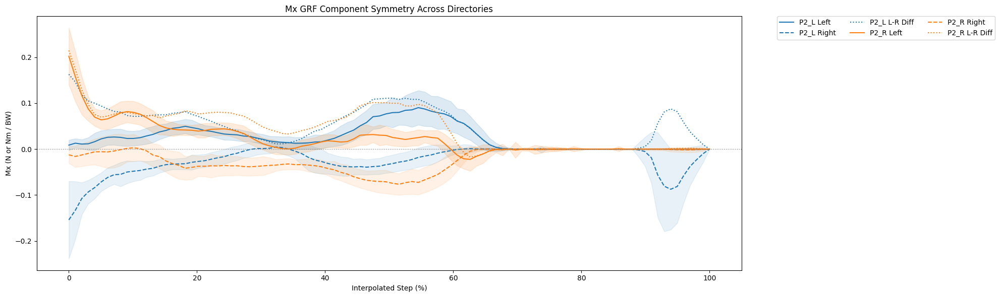

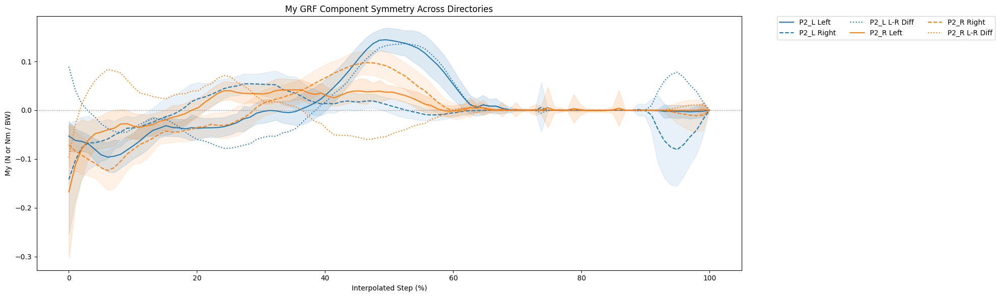

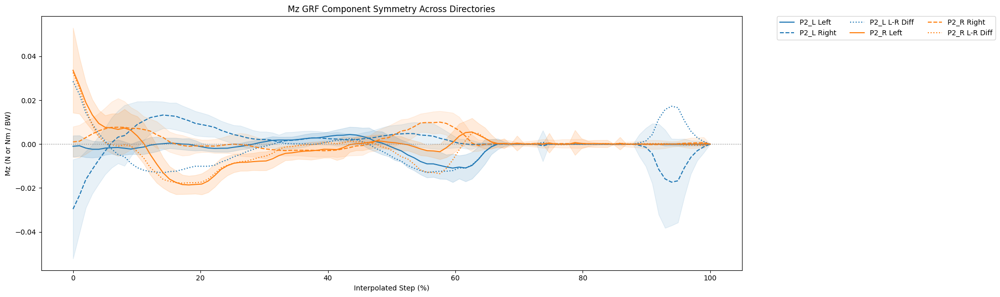

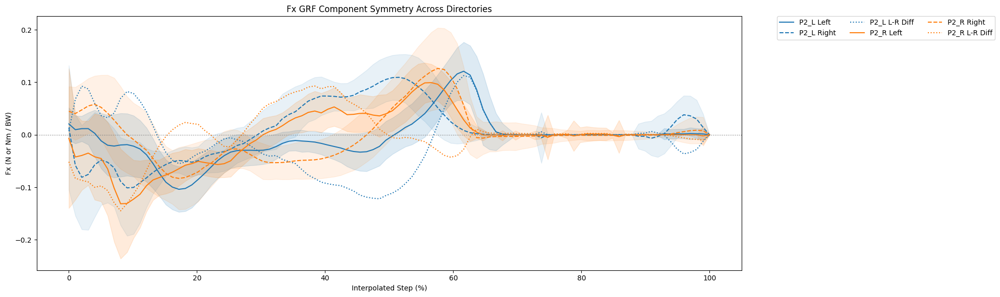

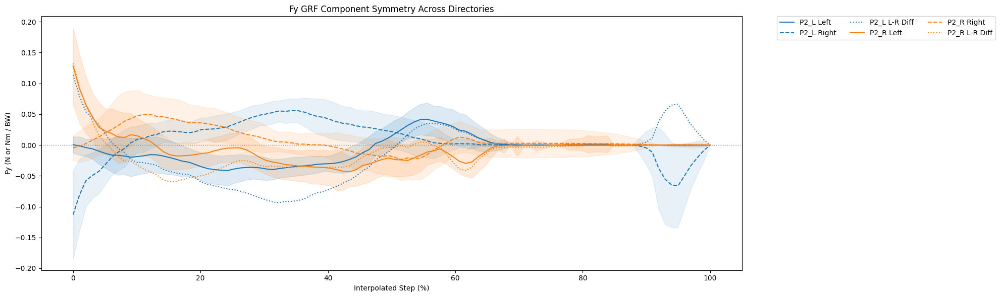

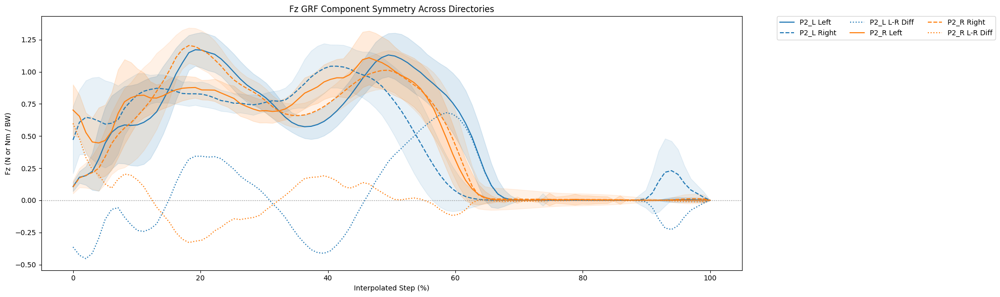

In [26]:
grf_components = ['Mx', 'My', 'Mz','Fx', 'Fy', 'Fz']  # Adjust if your GRF data has different columns
# interp_len = 100

importlib.reload(eval_pros)

postprocess_handler = eval_pros.PostProcessMetricsHandler()

postprocess_handler.plot_grf_component_symmetry_summed_all_dirs(
        grf_components,
        all_loaded_data,
        run_step_data,
        #interp_len=100,
        body_weight_to_normalize = 86.6*9.81,
    )
# plt.legend(ncol=3, bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

In [13]:
# import loco_mujoco.evaluation.evaluation_prosthesis as eval_pros

# import importlib
# importlib.reload(eval_pros)

# postprocess_handler = eval_pros.PostProcessMetricsHandler()
# run_step_data = {}

# min_walk_step_length_left = 30
# min_walk_step_length = 70

# for run_key, run_dict in all_loaded_data.items():
#     all_grf_l = np.array(run_dict.get("all_grf_l"))
#     all_grf_r = np.array(run_dict.get("all_grf_r"))
#     z_grf_l = all_grf_l[:,5]
#     z_grf_r = all_grf_r[:,5]

#     step_start_left = postprocess_handler.get_start_steps_from_grfZ(z_grf_l, min_walk_step_length=30)
#     step_start_right = postprocess_handler.get_start_steps_from_grfZ(z_grf_r, min_walk_step_length=60)
#     print('step_start_left', step_start_left)
#     print('step_start_right', step_start_right)
#     run_step_data[run_key] = {
#         "step_start_left": step_start_left,
#         "step_start_right": step_start_right,
#     }

In [27]:
# import loco_mujoco.evaluation.evaluation_prosthesis as eval_pros

# import importlib
# importlib.reload(eval_pros)

# postprocess_handler = eval_pros.PostProcessMetricsHandler()

postprocess_handler.plot_full_grf_with_step_markers(
    all_loaded_data,
    run_step_data,
    component_index=5
)

KeyError: 'all_grf_l'

Joint kinematics 

In [28]:
# joint_names_list = ['arm_flex', 'arm_add','arm_rot', 'elbow_flex', 'prop_sup', 'wrist_flex', 'wrist_dev', 'lumbar_extension', 'lumbar_bending', 'lumbar_rotation']  #'hip_rotation',# List of joint base names
# joint_names_list = ['hip_adduction', 'hip_rotation']  #'hip_rotation',# List of joint base names
joint_names_list = ['hip_flexion', 'knee_angle', 'ankle_angle', 'mtp_angle']  #'hip_rotation',# List of joint base names
# joint_names_list = ['socket_tx', 'socket_ty', 'socket_tz', 'socket_flexion', 'socket_adduction', 'socket_rotation']  #'hip_rotation',# List of joint base names
# plot angle
postprocess_handler.plot_joint_angle_symmetry_all_runs(
    joint_names_list,
    all_loaded_data,
    run_step_data,
    parameter_name="angle",
    convert_to_deg=True,
    interp_mode="interp",
    interp_len=100,
    plot_baseline=True,
    baseline_data=joint_data_baseline,
)   


# plot velocity 
postprocess_handler.plot_joint_angle_symmetry_all_runs(
    joint_names_list,
    all_loaded_data,
    run_step_data,
    parameter_name="velocity",
    convert_to_deg=True,
    interp_mode="interp",
    interp_len=100,
    plot_baseline=True,
    baseline_data=joint_data_baseline,
)

# plot forces_constraint    
postprocess_handler.plot_joint_angle_symmetry_all_runs(
    joint_names_list,
    all_loaded_data,
    run_step_data,
    parameter_name="forces_constraint",
    convert_to_deg=False,
    interp_mode="interp",
    interp_len=100,
    body_weight_to_normalize = 86.6*9.81,
)

# force_smooth 
postprocess_handler.plot_joint_angle_symmetry_all_runs(
    joint_names_list,
    all_loaded_data,
    run_step_data,
    parameter_name="forces_smooth",
    convert_to_deg=False,
    interp_mode="interp",
    interp_len=100,
    body_weight_to_normalize = 86.6*9.81,
)

# torques
postprocess_handler.plot_joint_angle_symmetry_all_runs(
    joint_names_list,
    all_loaded_data,
    run_step_data,
    parameter_name="torques",
    convert_to_deg=False,
    interp_mode="interp",
    interp_len=100,
    body_weight_to_normalize = 86.6,
)

postprocess_handler.plot_joint_angle_symmetry_all_runs(
    joint_names_list,
    all_loaded_data,
    run_step_data,
    parameter_name="energy_exp",
    convert_to_deg=False,
    interp_mode="interp",
    interp_len=100,
)



TypeError: 'NoneType' object is not iterable

In [29]:
joint_names_list = ['socket_tx', 'socket_ty', 'socket_tz', 'socket_flexion', 'socket_adduction', 'socket_rotation']  #'hip_rotation',# List of joint base names
# plot angle
postprocess_handler.plot_joint_angle_single_side_all_runs(
    joint_names_list,
    all_loaded_data,
    run_step_data,
    parameter_name="angle",
    convert_to_deg=True,
    interp_mode="interp",
    interp_len=100,
    plot_baseline=True,
    baseline_data=joint_data_baseline,
)   


# plot velocity 
postprocess_handler.plot_joint_angle_single_side_all_runs(
    joint_names_list,
    all_loaded_data,
    run_step_data,
    parameter_name="velocity",
    convert_to_deg=True,
    interp_mode="interp",
    interp_len=100,
    plot_baseline=True,
    baseline_data=joint_data_baseline,
)

# plot forces_constraint    
postprocess_handler.plot_joint_angle_single_side_all_runs(
    joint_names_list,
    all_loaded_data,
    run_step_data,
    parameter_name="forces_constraint",
    convert_to_deg=False,
    interp_mode="interp",
    interp_len=100,
)

# force_smooth 
postprocess_handler.plot_joint_angle_single_side_all_runs(
    joint_names_list,
    all_loaded_data,
    run_step_data,
    parameter_name="forces_smooth",
    convert_to_deg=False,
    interp_mode="interp",
    interp_len=100,
)

# force_smooth 
postprocess_handler.plot_joint_angle_single_side_all_runs(
    joint_names_list,
    all_loaded_data,
    run_step_data,
    parameter_name="forces_applied",
    convert_to_deg=False,
    interp_mode="interp",
    interp_len=100,
)

# # torques
# postprocess_handler.plot_joint_angle_single_side_all_runs(
#     joint_names_list,
#     all_loaded_data,
#     run_step_data,
#     parameter_name="torques",
#     convert_to_deg=False,
#     interp_mode="interp",
#     interp_len=100,
# )

# postprocess_handler.plot_joint_angle_single_side_all_runs(
#     joint_names_list,
#     all_loaded_data,
#     run_step_data,
#     parameter_name="energy_exp",
#     convert_to_deg=False,
#     interp_mode="interp",
#     interp_len=100,
# )


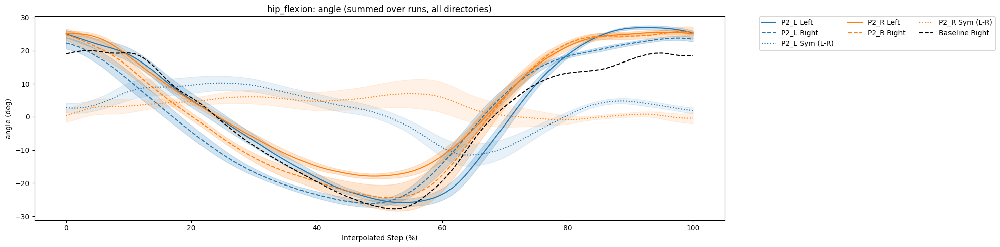

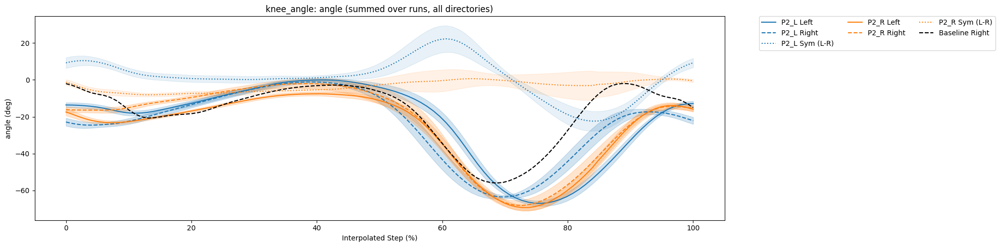

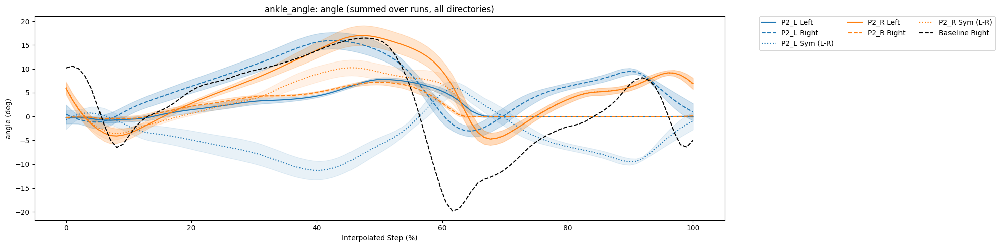

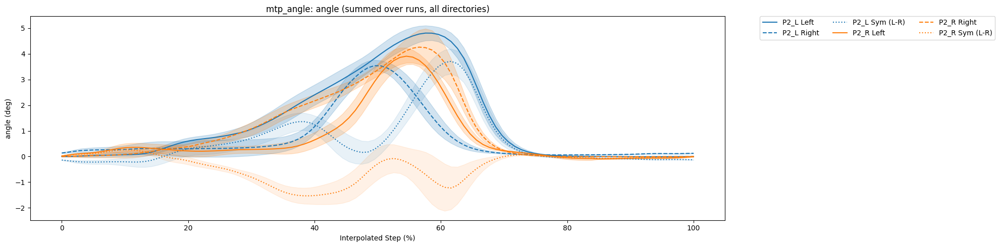

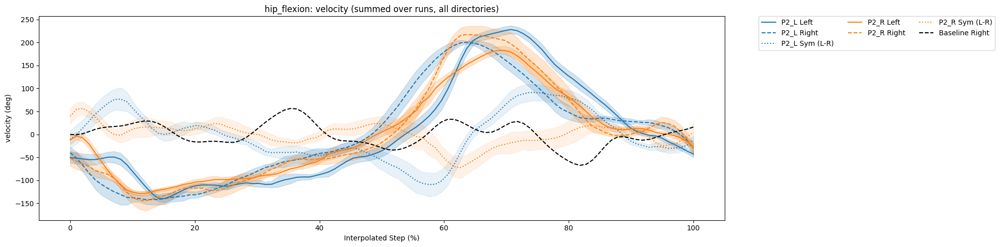

...

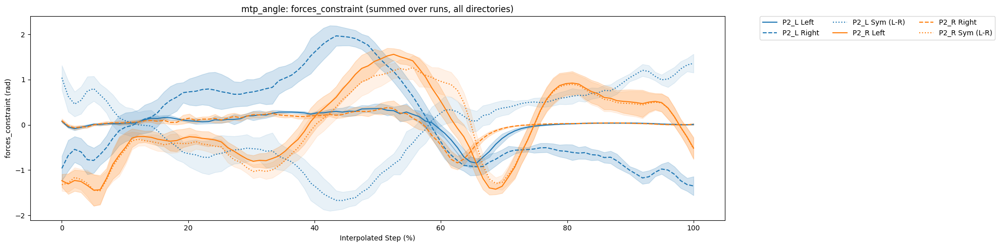

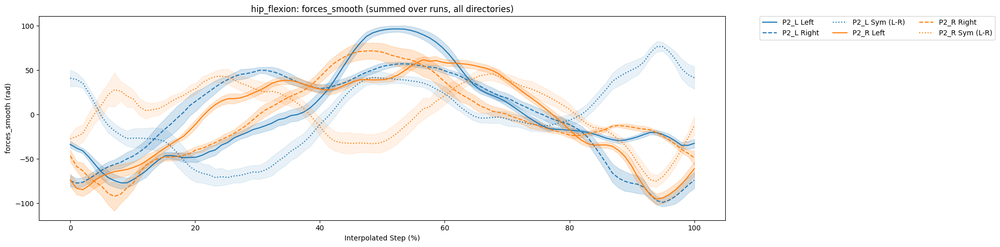

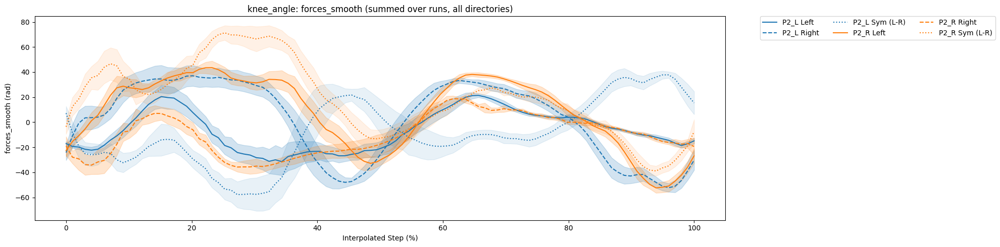

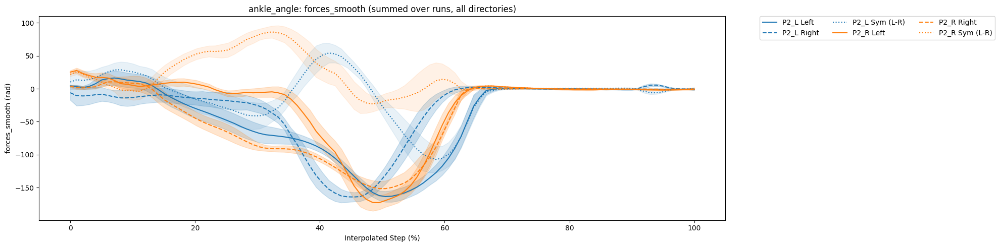

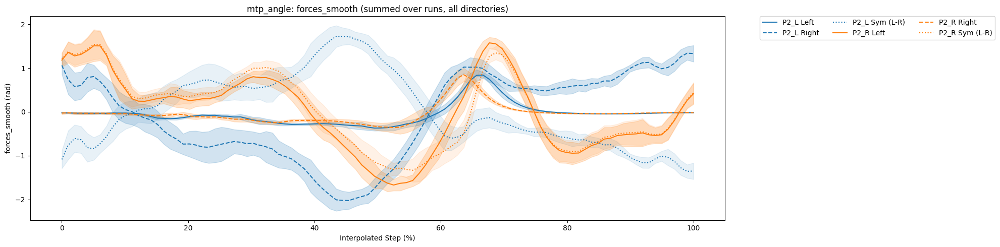

Skipping hip_flexion in P2_L, no data found.
Skipping hip_flexion in P2_R, no data found.


/home/nadinebadie/loco-mujoco/loco_mujoco/evaluation/evaluation_prosthesis.py:4755: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(ncol=3, bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)


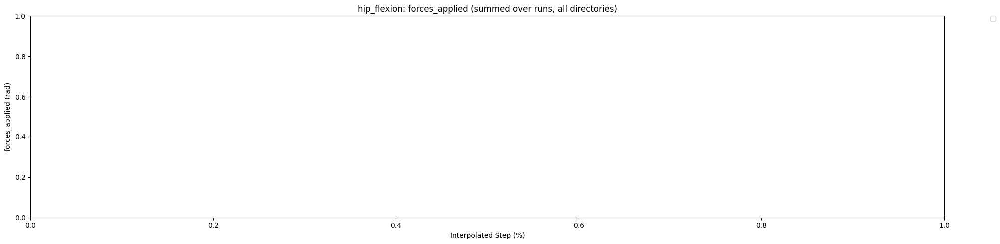

Skipping knee_angle in P2_L, no data found.
Skipping knee_angle in P2_R, no data found.


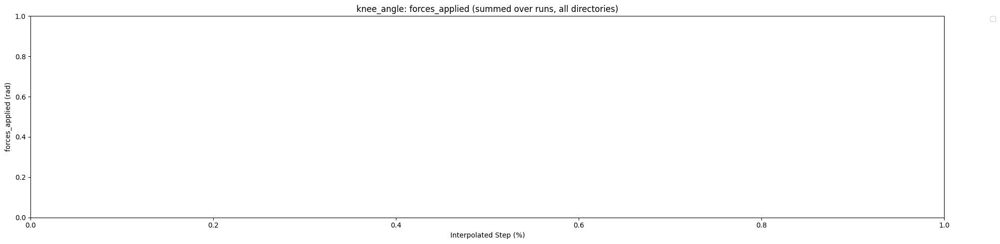

Skipping ankle_angle in P2_L, no data found.
Skipping ankle_angle in P2_R, no data found.


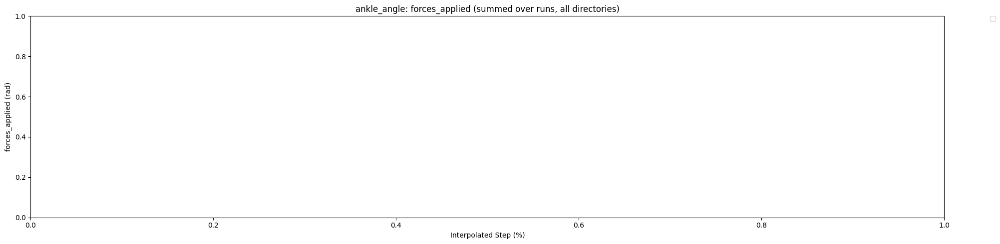

Skipping mtp_angle in P2_L, no data found.
Skipping mtp_angle in P2_R, no data found.


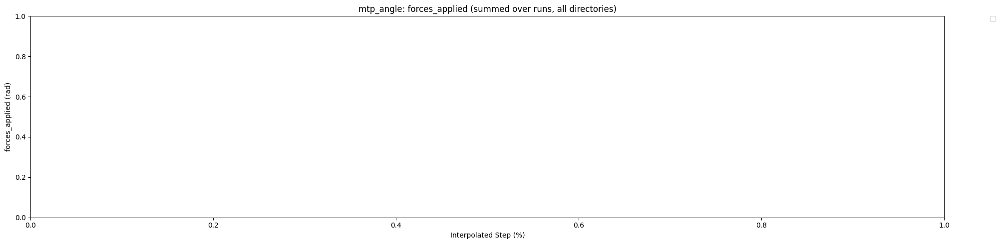

Skipping hip_flexion in P2_L, no data found.
Skipping hip_flexion in P2_R, no data found.


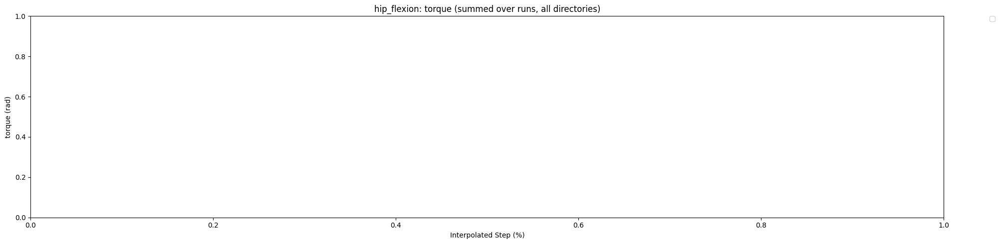

Skipping knee_angle in P2_L, no data found.
Skipping knee_angle in P2_R, no data found.


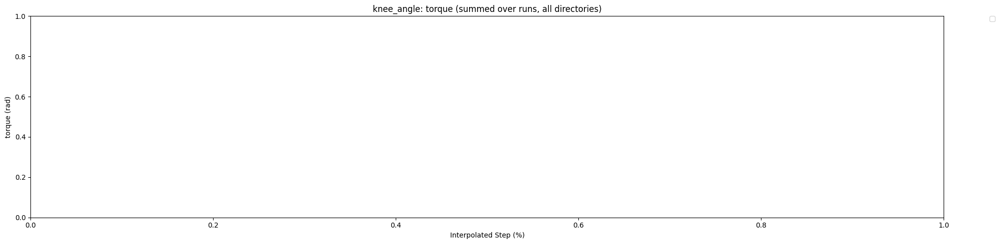

Skipping ankle_angle in P2_L, no data found.
Skipping ankle_angle in P2_R, no data found.


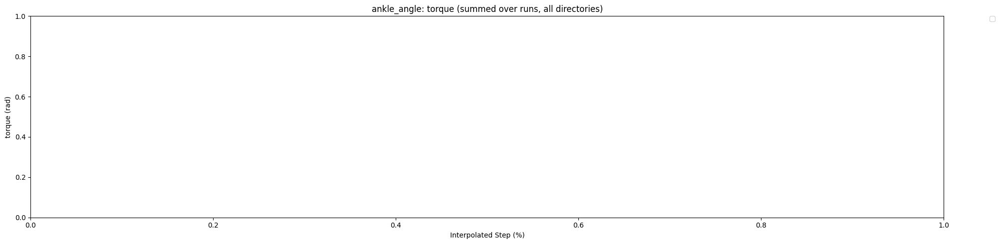

Skipping mtp_angle in P2_L, no data found.
Skipping mtp_angle in P2_R, no data found.


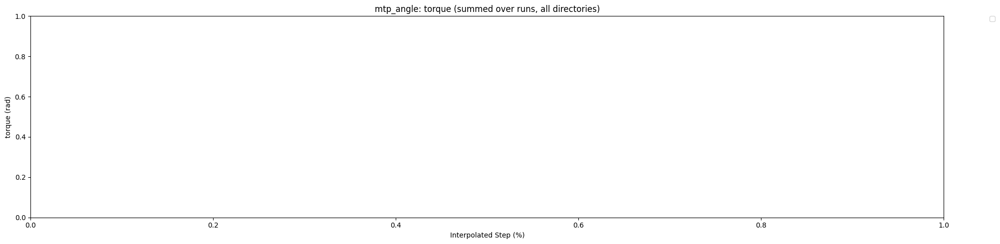

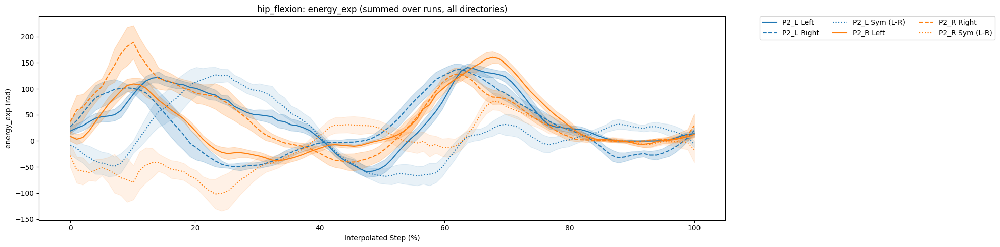

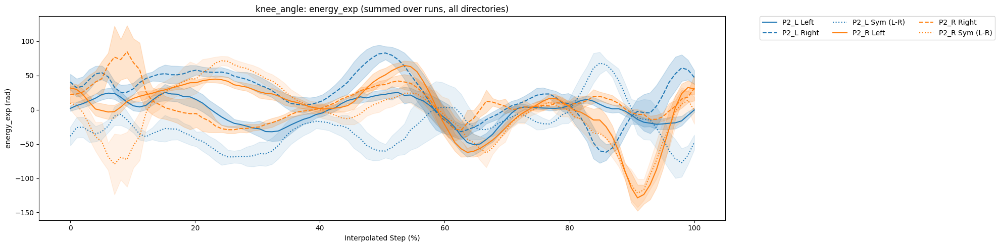

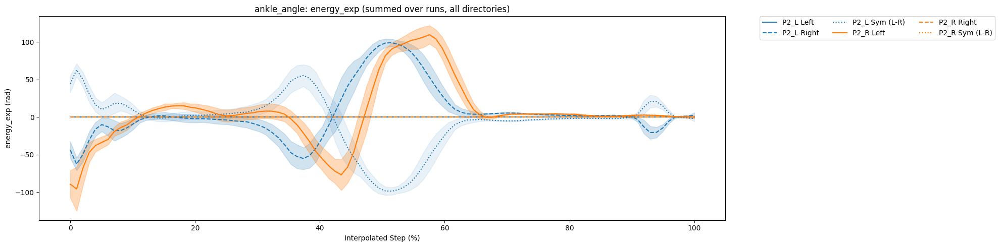

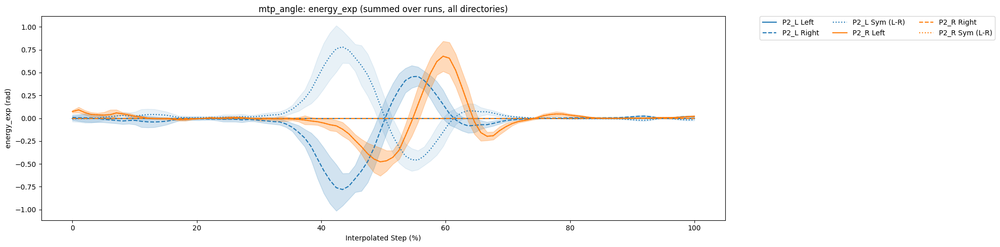

In [30]:
# Joint data over all runs summed up 

# Muscle activation over all runs 
importlib.reload(eval_pros)

postprocess_handler = eval_pros.PostProcessMetricsHandler()

joint_names_list = ['hip_flexion', 'knee_angle', 'ankle_angle', 'mtp_angle']  #'hip_rotation',# List of joint base names
# joint_names_list = ['socket_tx', 'socket_ty', 'socket_tz', 'socket_flexion', 'socket_adduction', 'socket_rotation']  #'hip_rotation',# List of joint base names
# plot angle
postprocess_handler.plot_joint_angle_summed_sides_all_dirs(
    joint_names_list,
    all_loaded_data,
    run_step_data,
    parameter_name="angle",
    convert_to_deg=True,
    interp_mode="interp",
    interp_len=100,
    baseline_data=joint_data_baseline,
)   


# plot velocity 
postprocess_handler.plot_joint_angle_summed_sides_all_dirs(
    joint_names_list,
    all_loaded_data,
    run_step_data,
    parameter_name="velocity",
    convert_to_deg=True,
    interp_mode="interp",
    interp_len=100,
    baseline_data=joint_data_baseline,
)

# plot forces_constraint    
postprocess_handler.plot_joint_angle_summed_sides_all_dirs(
    joint_names_list,
    all_loaded_data,
    run_step_data,
    parameter_name="forces_constraint",
    convert_to_deg=False,
    interp_mode="interp",
    interp_len=100,
)

# force_smooth 
postprocess_handler.plot_joint_angle_summed_sides_all_dirs(
    joint_names_list,
    all_loaded_data,
    run_step_data,
    parameter_name="forces_smooth",
    convert_to_deg=False,
    interp_mode="interp",
    interp_len=100,
)

# force_smooth 
postprocess_handler.plot_joint_angle_summed_sides_all_dirs(
    joint_names_list,
    all_loaded_data,
    run_step_data,
    parameter_name="forces_applied",
    convert_to_deg=False,
    interp_mode="interp",
    interp_len=100,
)


# torque
postprocess_handler.plot_joint_angle_summed_sides_all_dirs(
    joint_names_list,
    all_loaded_data,
    run_step_data,
    parameter_name="torque",
    convert_to_deg=False,
    interp_mode="interp",
    interp_len=100,
)

# energy expenditure
postprocess_handler.plot_joint_angle_summed_sides_all_dirs(
    joint_names_list,
    all_loaded_data,
    run_step_data,
    parameter_name="energy_exp",
    convert_to_deg=False,
    interp_mode="interp",
    interp_len=100,
)

Muscle activation

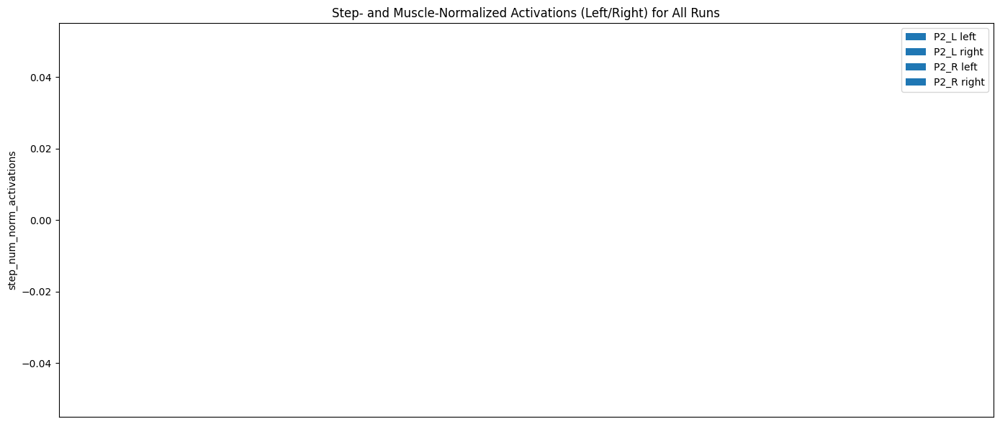

In [31]:
# Bar plot sum along all steps and muscles data for all muscles and all parameters 

all_run_keys = list(all_loaded_data.keys())
# Get all muscle groups that appear as _left/_right in any run
all_muscle_groups = set()
for run_key in all_run_keys:
    run_dict = all_loaded_data[run_key]
    act = run_dict.get("step_num_norm_activations") #"sum_muscles_activations") #"step_num_norm_activations")
    if act is not None:
        mg = list(act.keys())
        all_muscle_groups.update([g.replace('_left', '') for g in mg if g.endswith('_left') and g.replace('_left', '_right') in mg])
all_muscle_groups = sorted(all_muscle_groups)

# Bar plot for step_num_norm_activations for all runs and all muscle groups
step_num_norm_matrix = []
for run_key in all_run_keys:
    run_dict = all_loaded_data[run_key]
    act = run_dict.get("step_num_norm_activations") #"sum_muscles_activations") #("step_num_norm_activations")
    vals = []
    for base in all_muscle_groups:
        left = act.get(f"{base}_left") if act else None
        right = act.get(f"{base}_right") if act else None
        # Convert to scalar
        if isinstance(left, tuple):
            left = left[0]
        if hasattr(left, "item"):
            left = left.item()
        if isinstance(right, tuple):
            right = right[0]
        if hasattr(right, "item"):
            right = right.item()
        # Plot both left and right
        vals.append(left if left is not None else np.nan)
        vals.append(right if right is not None else np.nan)
    step_num_norm_matrix.append(vals)

step_num_norm_matrix = np.array(step_num_norm_matrix)  # shape: (n_runs, 2*n_groups)
bar_width = 0.1
x = np.arange(len(all_muscle_groups))
plt.figure(figsize=(14, 6))
for i, run_key in enumerate(all_run_keys):
    left_vals = step_num_norm_matrix[i, 0::2]
    right_vals = step_num_norm_matrix[i, 1::2]
    plt.bar(x + i * bar_width, left_vals, width=bar_width/2, label=f"{run_key} left", alpha=0.7)
    plt.bar(x + i * bar_width + bar_width/2, right_vals, width=bar_width/2, label=f"{run_key} right", alpha=0.7, hatch='//')
plt.xticks(x + bar_width * (len(all_run_keys)-1)/2, all_muscle_groups, rotation=45, ha='right')
plt.ylabel("step_num_norm_activations")
plt.title("Step- and Muscle-Normalized Activations (Left/Right) for All Runs")
plt.legend()
plt.tight_layout()
plt.show()
plt.close()


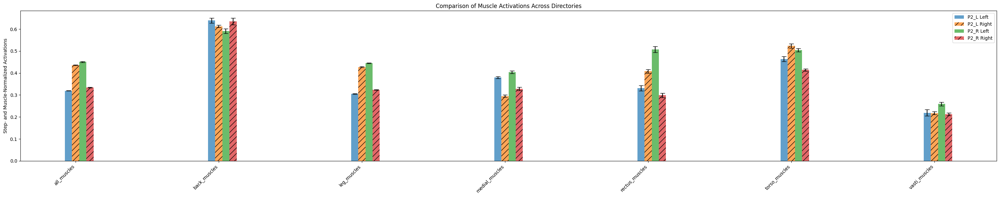

In [32]:
# Bar plot sum along all steps and muscles data for all muscles and all parameters summed up over all runs 
# --- Collect muscle activations per directory ---
dir_labels = list(all_loaded_data.keys())
all_muscle_groups = set()

# First, get all muscle groups present in any directory
for dir_label, runs in all_loaded_data.items():
    for run_number, run_dict in runs.items():
        act = run_dict.get("step_num_norm_activations")
        if act is not None:
            mg = list(act.keys())
            all_muscle_groups.update(
                [g.replace('_left', '') for g in mg if g.endswith('_left') and g.replace('_left', '_right') in mg]
            )
all_muscle_groups = sorted(all_muscle_groups)

# Initialize storage
dir_left_means_all = {dir_label: [] for dir_label in dir_labels}
dir_right_means_all = {dir_label: [] for dir_label in dir_labels}
dir_left_stds_all = {dir_label: [] for dir_label in dir_labels}
dir_right_stds_all = {dir_label: [] for dir_label in dir_labels}

# Collect per-directory activations
for dir_label, runs in all_loaded_data.items():
    pooled_left = {base: [] for base in all_muscle_groups}
    pooled_right = {base: [] for base in all_muscle_groups}

    for run_number, run_dict in runs.items():
        act = run_dict.get("step_num_norm_activations")
        if act is None:
            continue
        for base in all_muscle_groups:
            left = act.get(f"{base}_left")
            right = act.get(f"{base}_right")
            if isinstance(left, tuple):
                left = left[0]
            if hasattr(left, "item"):
                left = left.item()
            if isinstance(right, tuple):
                right = right[0]
            if hasattr(right, "item"):
                right = right.item()
            if left is not None:
                pooled_left[base].append(left)
            if right is not None:
                pooled_right[base].append(right)

    # Compute mean ± std across runs for this directory
    dir_left_means_all[dir_label] = [np.mean(pooled_left[base]) if pooled_left[base] else np.nan for base in all_muscle_groups]
    dir_left_stds_all[dir_label] = [np.std(pooled_left[base]) if pooled_left[base] else np.nan for base in all_muscle_groups]
    dir_right_means_all[dir_label] = [np.mean(pooled_right[base]) if pooled_right[base] else np.nan for base in all_muscle_groups]
    dir_right_stds_all[dir_label] = [np.std(pooled_right[base]) if pooled_right[base] else np.nan for base in all_muscle_groups]

# --- Plot comparison for both directories ---
x = np.arange(len(all_muscle_groups))
bar_width = 0.05 #0.2  # smaller to fit 4 bars per muscle

plt.figure(figsize=(30, 6))

# Offsets for 4 bars: left/right for dir1 and left/right for dir2
# Dynamically compute offsets for left/right bars per directory
num_dirs = len(dir_labels)
offsets = []
for i in range(num_dirs):
    offsets.append((-0.5 + i) * 2 * bar_width)      # left bar for dir i
    offsets.append((-0.5 + i) * 2 * bar_width + bar_width)  # right bar for dir i

for i, dir_label in enumerate(dir_labels):
    plt.bar(x + offsets[2*i], dir_left_means_all[dir_label], width=bar_width, yerr=dir_left_stds_all[dir_label],
            capsize=5, alpha=0.7, label=f"{dir_label} Left")
    plt.bar(x + offsets[2*i+1], dir_right_means_all[dir_label], width=bar_width, yerr=dir_right_stds_all[dir_label],
            capsize=5, alpha=0.7, hatch='//', label=f"{dir_label} Right")

plt.xticks(x, all_muscle_groups, rotation=45, ha='right')
plt.ylabel("Step- and Muscle-Normalized Activations")
plt.title("Comparison of Muscle Activations Across Directories")
plt.legend()
plt.tight_layout()
plt.show()
plt.close()



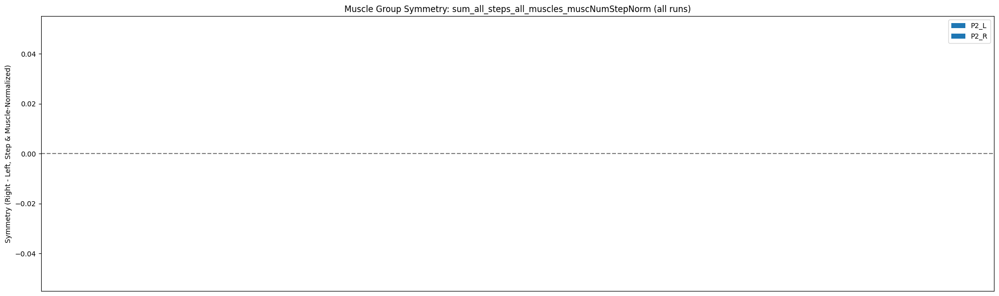

In [33]:
# Muscle activation symmetry (right - left) for each muscle group, for all runs, side-by-side bars
all_run_keys = list(all_loaded_data.keys())
# Get all muscle groups that appear as _left/_right in any run
all_muscle_groups = set()
for run_key in all_run_keys:
    run_dict = all_loaded_data[run_key]
    act = run_dict.get("step_num_norm_activations")
    if act is not None:
        mg = list(act.keys())
        all_muscle_groups.update([g.replace('_left', '') for g in mg if g.endswith('_left') and g.replace('_left', '_right') in mg])
all_muscle_groups = sorted(all_muscle_groups)

# Collect symmetry values for each run
symmetry_matrix = []
for run_key in all_run_keys:
    run_dict = all_loaded_data[run_key]
    act = run_dict.get("step_num_norm_activations")
    vals = []
    for base in all_muscle_groups:
        left = act.get(f"{base}_left") if act else None
        right = act.get(f"{base}_right") if act else None
        # Convert to scalar
        if isinstance(left, tuple):
            left = left[0]
        if hasattr(left, "shape") and np.size(left) == 1:
            left = float(left)
        elif hasattr(left, "item") and np.size(left) == 1:
            left = left.item()
        if isinstance(right, tuple):
            right = right[0]
        if hasattr(right, "shape") and np.size(right) == 1:
            right = float(right)
        elif hasattr(right, "item") and np.size(right) == 1:
            right = right.item()
        if left is not None and right is not None:
            vals.append(right - left)
        else:
            vals.append(np.nan)
    symmetry_matrix.append(vals)

symmetry_matrix = np.array(symmetry_matrix)  # shape: (n_runs, n_groups)

# Plot side-by-side bars
bar_width = 0.1 #0.2
x = np.arange(len(all_muscle_groups))
plt.figure(figsize=(20, 6))
for i, run_key in enumerate(all_run_keys):
    plt.bar(x + i * bar_width, symmetry_matrix[i], width=bar_width, label=run_key)
plt.axhline(0, color='gray', linestyle='--')
plt.xticks(x + bar_width * (len(all_run_keys)-1)/2, all_muscle_groups, rotation=45, ha='right')
plt.ylabel("Symmetry (Right - Left, Step & Muscle-Normalized)")
plt.title("Muscle Group Symmetry: sum_all_steps_all_muscles_muscNumStepNorm (all runs)")
plt.legend()
plt.tight_layout()
plt.show()
plt.close()

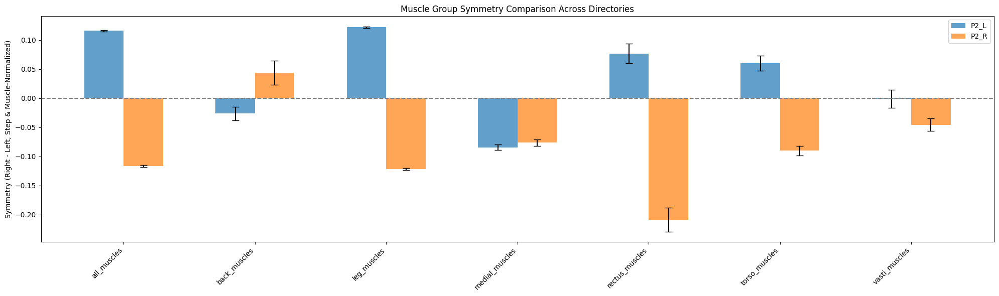

In [34]:
# Muscle activation symmetry (right - left) for each muscle group, for all runs, side-by-side bars summed up over all runs 
# --- Collect symmetry values per directory ---
dir_labels = list(all_loaded_data.keys())
all_muscle_groups = set()

# Collect all muscle groups from any directory
for dir_label, runs in all_loaded_data.items():
    for run_number, run_dict in runs.items():
        act = run_dict.get("step_num_norm_activations")
        if act is not None:
            mg = list(act.keys())
            all_muscle_groups.update(
                [g.replace('_left', '') for g in mg if g.endswith('_left') and g.replace('_left', '_right') in mg]
            )
all_muscle_groups = sorted(all_muscle_groups)

# Initialize storage
dir_sym_means_all = {dir_label: [] for dir_label in dir_labels}
dir_sym_stds_all = {dir_label: [] for dir_label in dir_labels}

# Collect symmetry values (right - left) per directory
for dir_label, runs in all_loaded_data.items():
    pooled_symmetry = {base: [] for base in all_muscle_groups}

    for run_number, run_dict in runs.items():
        act = run_dict.get("step_num_norm_activations")
        if act is None:
            continue
        for base in all_muscle_groups:
            left = act.get(f"{base}_left")
            right = act.get(f"{base}_right")

            # Convert to scalar if needed
            if isinstance(left, tuple): left = left[0]
            if hasattr(left, "shape") and np.size(left) == 1: left = float(left)
            elif hasattr(left, "item") and np.size(left) == 1: left = left.item()
            if isinstance(right, tuple): right = right[0]
            if hasattr(right, "shape") and np.size(right) == 1: right = float(right)
            elif hasattr(right, "item") and np.size(right) == 1: right = right.item()

            if left is not None and right is not None:
                pooled_symmetry[base].append(right - left)

    # Compute mean ± std for this directory
    dir_sym_means_all[dir_label] = [np.mean(pooled_symmetry[base]) if pooled_symmetry[base] else np.nan
                                    for base in all_muscle_groups]
    dir_sym_stds_all[dir_label] = [np.std(pooled_symmetry[base]) if pooled_symmetry[base] else np.nan
                                   for base in all_muscle_groups]

# --- Plot comparison ---
x = np.arange(len(all_muscle_groups))
bar_width = 0.3  # space for side-by-side bars

plt.figure(figsize=(20, 6))

# Offsets for multiple directories
offsets = np.linspace(-bar_width/2, bar_width/2, len(dir_labels))

for i, dir_label in enumerate(dir_labels):
    plt.bar(x + offsets[i], dir_sym_means_all[dir_label],width=bar_width,
            yerr=dir_sym_stds_all[dir_label], capsize=5, alpha=0.7,
            label=f"{dir_label}")

plt.axhline(0, color='gray', linestyle='--')
plt.xticks(x, all_muscle_groups, rotation=45, ha='right')
plt.ylabel("Symmetry (Right - Left, Step & Muscle-Normalized)")
plt.title("Muscle Group Symmetry Comparison Across Directories")
plt.legend()
plt.tight_layout()
plt.show()
plt.close()



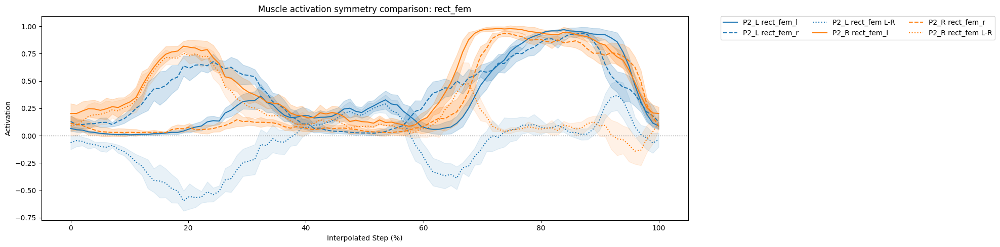

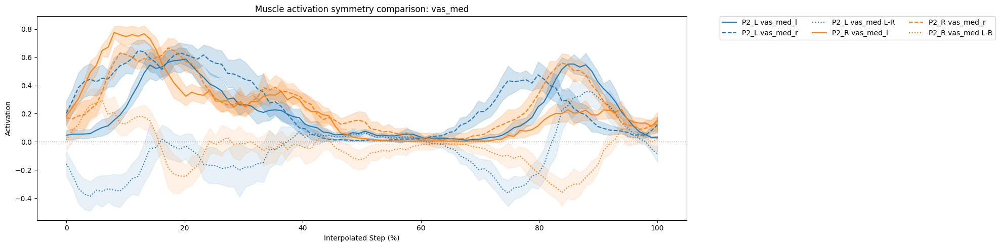

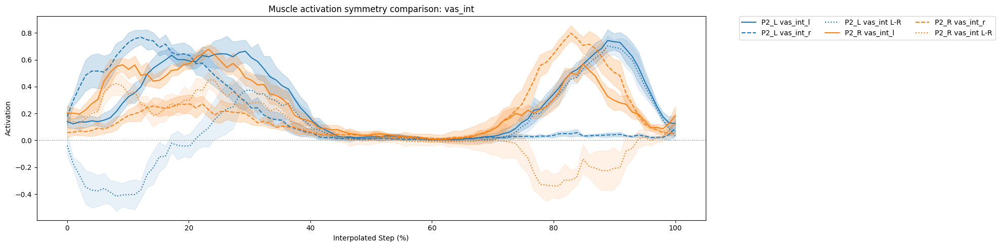

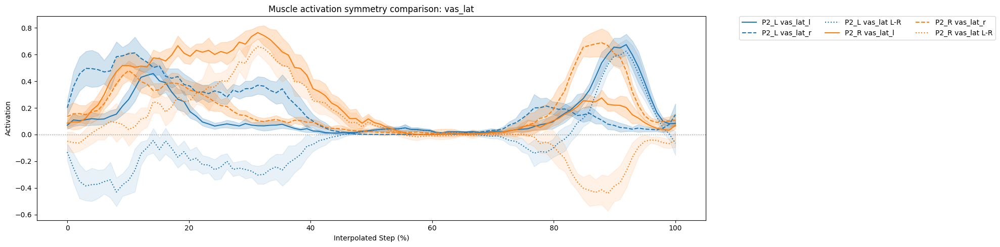

In [35]:
# Muscle activation over all runs 
importlib.reload(eval_pros)

postprocess_handler = eval_pros.PostProcessMetricsHandler()
# hamstring: 'bifemlh', 'semimem', 'semiten'
# Quadricpes: 'rect_fem', 'vas_med', 'vas_int', 'vas_lat'
# muscle_names_list = ['bifemlh', 'semimem', 'semiten'] # biceps_fem: lateral hamstring
muscle_names_list = ['rect_fem', 'vas_med', 'vas_int', 'vas_lat']
# ['rect_fem', 'iliacus']
#['med_gas','vas_med', 'glut_min3', 'glut_max1','glut_max2','glut_max3', 'bifemlh', 'semimem', 'semiten', 'quad_fem']  # List of muscle base names to plot
postprocess_handler.plot_muscle_activation_symmetry_all_dirs(
    muscle_names_list,
    all_loaded_data,
    run_step_data,
    interp_len=100,
)

# Pertubation forces

Loaded data: dict_keys([0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150, 160, 170, 180, 190, 200, 210, 220, 230, 240, 250, 260, 270, 280, 290, 300])


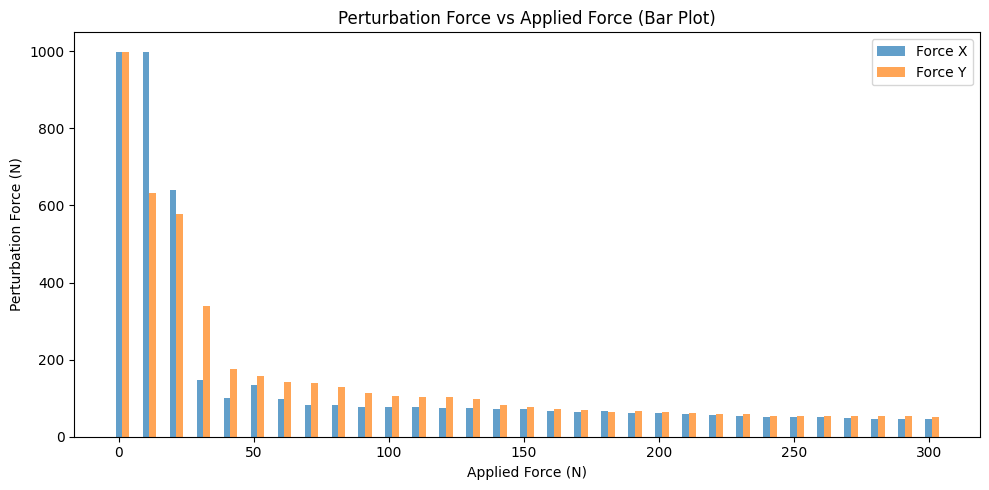

In [ ]:
# One Run 
perturb_path = "/home/nadinebadie/loco-mujoco/prosthesis_test/outputs/2025-06-07/02-31-13/20250617_003316_perturbation_force_time.pkl"


with open(perturb_path, "rb") as f:
    perturb_data = pickle.load(f)
    print(f"Loaded data: {perturb_data.keys()}")  # Print the keys of the loaded data to verify

force_min = 0 
force_max = 301 
force_increment = 10
force_direction = ['x', 'y']  #, 'z']  # Specify the force directions you want to plot
force_range = np.arange(force_min, force_max, force_increment)  


force_sort = {}
# Collect force values for each direction over the force_range
for d in force_direction: #, 'z']:
    force_sort[d] = [perturb_data[f][d] if f in perturb_data and d in perturb_data[f] else np.nan for f in force_range]

# Plot the perturbation forces for each direction as bar plots
plt.figure(figsize=(10, 5))
bar_width = 2.5  # width of each bar

for idx, (d, label, color) in enumerate(zip(force_direction, ['Force X', 'Force Y', 'Force Z'], ['tab:blue', 'tab:orange', 'tab:green'])):
    plt.bar(force_range + idx * bar_width, force_sort[d], width=bar_width, label=label, alpha=0.7, color=color)

plt.xlabel("Applied Force (N)")
plt.ylabel("Steps until Fall")
plt.title("Perturbation Force vs Steps until Fall")
plt.legend()
plt.tight_layout()
plt.show()
plt.close()


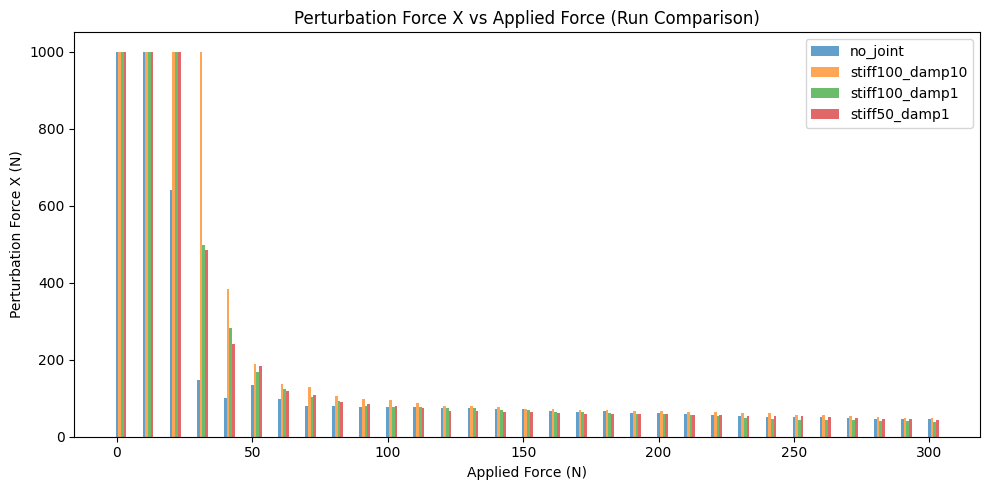

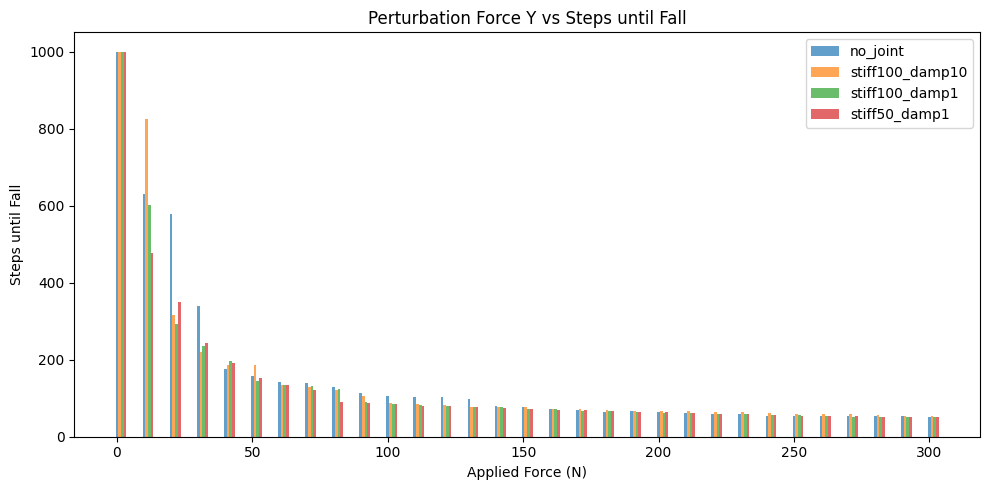

In [21]:
# print("Loading perturbation data...")
perturb_file = {}

# Fix missing comma in perturb_path
perturb_path = {
    'no_joint': "/home/nadinebadie/loco-mujoco/prosthesis_test/outputs/2025-06-07/02-31-13/20250617_003316_perturbation_force_time.pkl",
    'stiff100_damp10': "/home/nadinebadie/loco-mujoco/prosthesis_test/outputs/2025-06-10/02-14-59/20250617_104629_perturbation_force_time_seed0.pkl",
    'stiff100_damp1': "/home/nadinebadie/loco-mujoco/prosthesis_test/outputs/2025-06-10/19-06-15/20250617_014911_perturbation_force_time.pkl", 
    'stiff50_damp1': "/home/nadinebadie/loco-mujoco/prosthesis_test/outputs/2025-06-11/16-30-59/20250617_015022_perturbation_force_time.pkl"
}

# print("Perturb_path", perturb_path)

for run_name, path in perturb_path.items():
    # print(f"Loading data for {run_name} from {path}")
    with open(path, "rb") as f:
        perturb_file[run_name] = pickle.load(f)
    # print(f"Loaded data for {run_name}: {perturb_file[run_name].keys()}")  # Print the keys of the loaded data to verify

force_min = 0 
force_max = 301 
force_increment = 10
force_range = np.arange(force_min, force_max, force_increment)  

# Plot all x for all runs in one plot
plt.figure(figsize=(10, 5))
bar_width = 1  # width of each bar
colors = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red']  # Define colors for each run

for idx, (run_name, color) in enumerate(zip(perturb_file.keys(), colors)):
    perturb_data = perturb_file[run_name]
    force_x = [perturb_data[f]['x'] if f in perturb_data and 'x' in perturb_data[f] else np.nan for f in force_range]
    plt.bar(force_range + idx * bar_width, force_x, width=bar_width, label=run_name, alpha=0.7, color=color)

plt.xlabel("Applied Force (N)")
plt.ylabel("Perturbation Force X (N)")
plt.title("Perturbation Force X vs Applied Force (Run Comparison)")
plt.legend()
plt.tight_layout()
plt.savefig("/home/nadinebadie/loco-mujoco/prosthesis_test/perturbation_force_comparison_x.png")
plt.show()

# Plot all y for all runs in a second plot
plt.figure(figsize=(10, 5))

for idx, (run_name, color) in enumerate(zip(perturb_file.keys(), colors)):
    perturb_data = perturb_file[run_name]
    force_y = [perturb_data[f]['y'] if f in perturb_data and 'y' in perturb_data[f] else np.nan for f in force_range]
    plt.bar(force_range + idx * bar_width, force_y, width=bar_width, label=run_name, alpha=0.7, color=color)

plt.xlabel("Applied Force (N)")
plt.ylabel("Steps until Fall")
plt.title("Perturbation Force Y vs Steps until Fall")
plt.legend()
plt.tight_layout()
plt.savefig("/home/nadinebadie/loco-mujoco/prosthesis_test/perturbation_force_comparison_y.png")
plt.show()
plt.close()